In [1]:
import numpy as np
import os
import glob
import requests
import pandas as pd
from datetime import datetime, timedelta

from matplotlib import pyplot as plt


import json
import statsmodels.formula.api as smf

In [5]:

print("--- 1. Loading CSV data from OSF file ---")
DATA_DIR = 'hrl_load_metered_2016-2025/'
search_path = os.path.join(DATA_DIR, '**', '*.csv')
csv_files = sorted(glob.glob(search_path, recursive=True))
if not csv_files:
    print(f"Error: No CSV files found in {DATA_DIR}.")
    dataframes = {}
else:
    print(f"Found {len(csv_files)} CSV files. Loading each one...")
    dataframes = {}
    all_dates = []  
    for file_path in csv_files:
        file_name = os.path.basename(file_path)
        try:
            df = pd.read_csv(file_path)
            date_col = df.columns[0]
            parsed_dates = pd.to_datetime(df[date_col], errors='coerce')
            all_dates.append(parsed_dates)
            dataframes[file_name] = df
            print(f"  - Successfully loaded and parsed dates from {file_name}")
        except Exception as e:
            print(f"Could not load {file_name}: {e}")

    print(f"\nSuccessfully loaded {len(dataframes)} DataFrames.")

#  --weather
if not dataframes:
    print("\nNo dataframes loaded, skipping weather fetch.")
else:
    print("\n--- 2. Fetching Weather Data for CSV Date Range ---")
    all_dates_combined = pd.concat(all_dates).dropna()
    min_date = all_dates_combined.min()
    max_date = all_dates_combined.max()
    
    # Format dates for the API (YYYY-MM-DD)
    start_str = min_date.strftime('%Y-%m-%d')
    end_str = max_date.strftime('%Y-%m-%d')
    
    print(f"Date range found in CSVs: {start_str} to {end_str}")
    print("Fetching corresponding weather data from Open-Meteo...")

    API_URL = "https://archive-api.open-meteo.com/v1/archive"
    params = {
        "latitude": 39.95,   # Philadelphia
        "longitude": -75.16, # Philadelphia
        "start_date": start_str,
        "end_date": end_str,
        "hourly": "temperature_2m"
    }

    try:
        response = requests.get(API_URL, params=params)
        response.raise_for_status()  # Raises an error for bad responses (4xx or 5xx)
        weather_data = response.json()
        print("Successfully fetched and parsed weather data.")

        # --- 3. Process and Merge Weather Data ---
        print("\n--- 3. Processing and Merging Weather Data ---")
        hourly_data = weather_data.get('hourly', {})
        if not hourly_data:
            print("Error: No 'hourly' data found in API response.")
        else:
            # Create a clean, time-indexed DataFrame for the weather
            weather_df = pd.DataFrame(hourly_data)
            weather_df['time'] = pd.to_datetime(weather_df['time'])
            weather_df = weather_df.set_index('time')
            print("Created weather DataFrame. Head:")
            print(weather_df.head())

            # Now, let's merge this weather data back into your original CSVs
            # We'll just show an example using the first DataFrame
            
            first_df_key = list(dataframes.keys())[0]
            print(f"\nExample merge with first file: '{first_df_key}'")
            
            original_df = dataframes[first_df_key]
            date_col = original_df.columns[0]
            
            # Parse dates and set as index (this time on the original df)
            original_df[date_col] = pd.to_datetime(original_df[date_col])
            original_df = original_df.set_index(date_col)
            
            # Merge! This joins the temperature to the matching timestamp.
            # 'how=left' keeps all your original data.
            merged_df = original_df.merge(weather_df, left_index=True, right_index=True, how='left')
            
            print("Merged DataFrame (head):")
            print(merged_df.head())

    except requests.exceptions.RequestException as e:
        print(f"Error fetching weather data: {e}")
    except json.JSONDecodeError:
        print("Error: Could not decode JSON response from weather API.")
    except Exception as e:
        print(f"An error occurred during weather processing: {e}")
# --- 3. Processing and Merging Weather Data (for ALL CSVs) ---

hourly_data = weather_data.get('hourly', {})
if not hourly_data:
    print("Error: No 'hourly' data found in API response.")
else:
    # 3a) Clean, index the weather
    weather_df = pd.DataFrame(hourly_data)
    weather_df['time'] = pd.to_datetime(weather_df['time'], errors='coerce')
    weather_df = weather_df.dropna(subset=['time']).set_index('time').sort_index()
    print("Created weather DataFrame. Head:")
    print(weather_df.head())

    # 3b) Merge weather into EVERY loaded CSV
    merged_dataframes = {}
    print("\nMerging weather with all CSVs...")
    for fname, original_df in dataframes.items():
        df_i = original_df.copy()
        date_col = df_i.columns[0]                      # assume first column is the timestamp
        df_i[date_col] = pd.to_datetime(df_i[date_col], errors='coerce')
        df_i = df_i.dropna(subset=[date_col]).set_index(date_col).sort_index()

        merged_i = df_i.merge(weather_df, left_index=True, right_index=True, how='left')
        merged_i["source_file"] = fname                 # keep provenance if you want
        merged_dataframes[fname] = merged_i

        missing = int(merged_i["temperature_2m"].isna().sum())
        print(f"  - merged {fname}: {len(merged_i):,} rows (missing temperature_2m: {missing:,})")

    print(f"\nMerged weather into {len(merged_dataframes)} files.")

    # 3c) (Optional) Concatenate into one big DataFrame
    merged_df = (
        pd.concat(merged_dataframes.values(), axis=0, ignore_index=False)
          .rename_axis("timestamp")                    # index name for the merged time column
          .reset_index()
    )
    # If your downstream code expects 'datetime_beginning_ept', rename here:
    # merged_df = merged_df.rename(columns={"timestamp": "datetime_beginning_ept"})

    print("\nCombined merged_df shape:", merged_df.shape)
    print(merged_df.head())

    # (Optional) Save to disk
    # merged_df.to_csv("all_years_merged_with_weather.csv", index=False)

print("\n--- Python script execution finished. ---")

--- 1. Loading CSV data from OSF file ---
Found 10 CSV files. Loading each one...
  - Successfully loaded and parsed dates from hrl_load_metered_2016.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2017.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2018.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2019.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2020.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2021.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2022.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2023.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2024.csv
  - Successfully loaded and parsed dates from hrl_load_metered_2025.csv

Successfully loaded 10 DataFrames.

--- 2. Fetching Weather Data for CSV Date Range ---
Date range found in CSVs: 2016-01-01 to 2025-10-31
Fetching corresponding weather data from Open-Meteo...
Suc

In [396]:
load_area = [
    "AECO",
    "AEPAPT",
    "AEPIMP",
    "AEPKPT",
    "AEPOPT",
    "AP",
    "BC",
    "CE",
    "DAY",
    "DEOK",
    "DOM",
    "DPLCO",
    "DUQ",
    "EASTON",
    "EKPC",
    "JC",
    "ME",
    "OE",
    "OVEC",
    "PAPWR",
    "PE",
    "PEPCO",
    "PLCO",
    "PN",
    "PS",
    "RECO",
    "SMECO",
    "USI",
    "VMEU"
]


In [398]:
len(load_area)

29

In [400]:
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])
df.sort_values(["load_area", "ts"], inplace=True)

df["hour"]   = df["ts"].dt.hour
df["doy"]    = df["ts"].dt.dayofyear
df["sin_hour"] = np.sin(2*np.pi*df["hour"]/24)
df["cos_hour"] = np.cos(2*np.pi*df["hour"]/24)
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)
df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"])


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3276474003.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])


In [340]:
merged_df

,timestamp,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified,temperature_2m,source_file
0,2016-01-01 05:00:00,1/1/2016 12:00:00 AM,RFC,MIDATL,AE,AE,844.707,True,4.4,hrl_load_metered_2016.csv
1,2016-01-01 05:00:00,1/1/2016 12:00:00 AM,RFC,MIDATL,BC,BC,3008.152,True,4.4,hrl_load_metered_2016.csv
2,2016-01-01 05:00:00,1/1/2016 12:00:00 AM,RFC,MIDATL,DPL,DPLCO,1707.194,True,4.4,hrl_load_metered_2016.csv
3,2016-01-01 05:00:00,1/1/2016 12:00:00 AM,RFC,MIDATL,DPL,EASTON,24.611,True,4.4,hrl_load_metered_2016.csv
4,2016-01-01 05:00:00,1/1/2016 12:00:00 AM,RFC,MIDATL,JC,JC,2176.022,True,4.4,hrl_load_metered_2016.csv
...,...,...,...,...,...,...,...,...,...,...
2547518,2025-10-31 03:00:00,10/30/2025 11:00:00 PM,RFC,MIDATL,RECO,RECO,131.426,False,12.8,hrl_load_metered_2025.csv
2547519,2025-10-31 03:00:00,10/30/2025 11:00:00 PM,RFC,MIDATL,PEP,SMECO,287.267,False,12.8,hrl_load_metered_2025.csv
2547520,2025-10-31 03:00:00,10/30/2025 11:00:00 PM,RFC,MIDATL,PL,UGI,96.927,False,12.8,hrl_load_metered_2025.csv
2547521,2025-10-31 03:00:00,10/30/2025 11:00:00 PM,RFC,MIDATL,AE,VMEU,70.021,False,12.8,hrl_load_metered_2025.csv


In [413]:

df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])
df.sort_values(["load_area", "ts"], inplace=True)

df["year"] = df["ts"].dt.year
df["hour"]   = df["ts"].dt.hour
df["doy"]    = df["ts"].dt.dayofyear
df["sin_hour"] = np.sin(2*np.pi*df["hour"]/24)
df["cos_hour"] = np.cos(2*np.pi*df["hour"]/24)
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)
df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"])

# C(load_area) tells statsmodels to one-hot encode this categorical variable
formula = """
mw ~ C(load_area) + temperature_2m
     + sin_hour + cos_hour + sin_doy + cos_doy
     + mw_lag24 + mw_lag168
     + temperature_2m:sin_hour + temperature_2m:cos_hour
"""

model = smf.ols(formula=formula, data=df).fit()
print(model.summary())

# Predict on a new dataframe 'new_df' with the same feature columns:
# y_hat = model.predict(new_df)

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_8324/2440082144.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])


                            OLS Regression Results                            
Dep. Variable:                     mw   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 3.736e+06
Date:                Sat, 15 Nov 2025   Prob (F-statistic):               0.00
Time:                        17:11:37   Log-Likelihood:            -1.3277e+07
No. Observations:             1771971   AIC:                         2.655e+07
Df Residuals:                 1771941   BIC:                         2.655e+07
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [414]:
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))


In [415]:

train_df = df[(df["year"] >= 2016) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

valid_df["pred"] = model.predict(valid_df)
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")


per_area_rmse = (
    valid_df.groupby("load_area")
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)

Validation (2025) overall:
  RMSE: 439.91 MW


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_8324/2578617342.py:12: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


In [120]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Simple metric functions
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean((y_true - y_pred)**2))

# -------------------------
# 1) Start from your setup
# -------------------------
# merged_df must already exist
# load_area is your list of 21 areas

df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])
df.sort_values(["load_area", "ts"], inplace=True)
df["year"] = df["ts"].dt.year

df["hour"]   = df["ts"].dt.hour
df["doy"]    = df["ts"].dt.dayofyear
df["sin_hour"] = np.sin(2*np.pi*df["hour"]/24)
df["cos_hour"] = np.cos(2*np.pi*df["hour"]/24)
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area")["mw"].shift(48)
df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Make sure the categorical levels are consistent across train/valid
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)

df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"])

# -------------------------
# 2) Train/valid split
# -------------------------
train_df = df[(df["year"] >= 2016) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

# -------------------------
# 3) Same linear model
# -------------------------
formula = """
mw ~ C(load_area) + temperature_2m
     + sin_hour + cos_hour + sin_doy + cos_doy
     + mw_lag24 + mw_lag48 + mw_lag168
     + temperature_2m:sin_hour + temperature_2m:cos_hour
"""

model = smf.ols(formula=formula, data=train_df).fit()
print(model.summary())
# -------------------------
# 4) Predict on 2025
# -------------------------
valid_df["pred"] = model.predict(valid_df)

# -------------------------
# 5) Report errors
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])

print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
# Per-load_area RMSE (simple)
per_area_rmse = (
    valid_df.groupby("load_area")
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE on 2025:")
print(per_area_rmse)

# Per-hour-of-day RMSE (optional but handy)
per_hour_rmse = (
    valid_df.groupby("hour")
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE on 2025:")
print(per_hour_rmse)

# (Optional) Save detailed metrics
per_area_rmse.to_csv("metrics_2025_by_load_area.csv", float_format="%.3f")
per_hour_rmse.to_csv("metrics_2025_by_hour.csv", float_format="%.3f")
print("\nSaved: metrics_2025_by_load_area.csv, metrics_2025_by_hour.csv")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2787918939.py:21: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"])


                            OLS Regression Results                            
Dep. Variable:                     mw   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 3.264e+06
Date:                Sat, 15 Nov 2025   Prob (F-statistic):               0.00
Time:                        21:04:58   Log-Likelihood:            -1.2120e+07
No. Observations:             1619280   AIC:                         2.424e+07
Df Residuals:                 1619249   BIC:                         2.424e+07
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2787918939.py:73: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  valid_df.groupby("load_area")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2787918939.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2787918939.py:84: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is depre

## Add what day in variables

In [459]:
 pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)


['Sunday', 'Sunday', 'Sunday', 'Sunday', 'Sunday', ..., 'Thursday', 'Thursday', 'Thursday', 'Thursday', 'Thursday']
Length: 1771971
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']

In [36]:
df

,timestamp,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified,temperature_2m,source_file,...,year,hour,doy,dow_name,sin_hour,cos_hour,sin_doy,cos_doy,mw_lag24,mw_lag168
250656,2017-01-08 05:00:00,1/8/2017 12:00:00 AM,RFC,MIDATL,AE,AECO,1183.048,True,-8.2,hrl_load_metered_2017.csv,...,2017,0,8,Sunday,0.000000,1.000000,0.137185,0.990545,1096.364,1017.985
250684,2017-01-08 06:00:00,1/8/2017 1:00:00 AM,RFC,MIDATL,AE,AECO,1148.897,True,-8.4,hrl_load_metered_2017.csv,...,2017,1,8,Sunday,0.258819,0.965926,0.137185,0.990545,1055.755,964.157
250712,2017-01-08 07:00:00,1/8/2017 2:00:00 AM,RFC,MIDATL,AE,AECO,1137.400,True,-8.8,hrl_load_metered_2017.csv,...,2017,2,8,Sunday,0.500000,0.866025,0.137185,0.990545,1038.326,921.292
250740,2017-01-08 08:00:00,1/8/2017 3:00:00 AM,RFC,MIDATL,AE,AECO,1122.021,True,-9.3,hrl_load_metered_2017.csv,...,2017,3,8,Sunday,0.707107,0.707107,0.137185,0.990545,1029.205,897.977
250768,2017-01-08 09:00:00,1/8/2017 4:00:00 AM,RFC,MIDATL,AE,AECO,1129.955,True,-9.7,hrl_load_metered_2017.csv,...,2017,4,8,Sunday,0.866025,0.500000,0.137185,0.990545,1037.137,895.976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2547393,2025-10-30 23:00:00,10/30/2025 7:00:00 PM,RFC,MIDATL,PE,PE,4215.664,False,16.0,hrl_load_metered_2025.csv,...,2025,19,303,Thursday,-0.965926,0.258819,-0.877609,0.479378,4234.862,4047.910
2547423,2025-10-31 00:00:00,10/30/2025 8:00:00 PM,RFC,MIDATL,PE,PE,4019.636,False,15.8,hrl_load_metered_2025.csv,...,2025,20,303,Thursday,-0.866025,0.500000,-0.877609,0.479378,4094.712,3952.451
2547453,2025-10-31 01:00:00,10/30/2025 9:00:00 PM,RFC,MIDATL,PE,PE,3827.360,False,15.1,hrl_load_metered_2025.csv,...,2025,21,303,Thursday,-0.707107,0.707107,-0.877609,0.479378,3938.152,3731.728
2547483,2025-10-31 02:00:00,10/30/2025 10:00:00 PM,RFC,MIDATL,PE,PE,3566.912,False,13.8,hrl_load_metered_2025.csv,...,2025,22,303,Thursday,-0.500000,0.866025,-0.877609,0.479378,3634.543,3463.376


In [128]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Simple metric functions
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Setup — use datetime_beginning_ept directly (already EPT local time)
# -------------------------
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

# Parse as naive datetimes (they already represent EPT wall clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"])

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# ---- Seasonality by day-of-year only (keep); remove sin/cos of hour ----
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# ---- Hour dummies: categorical with fixed 0..23 levels ----
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area (safe: uses past values only)
df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area")["mw"].shift(48)
df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Ensure consistent categories across splits
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)

# Drop rows lacking features
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# -------------------------
# 2) Train/valid split
# -------------------------
train_df = df[(df["year"] >= 2023) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

# -------------------------
# 3) Linear model
# -------------------------
# - C(hour_cat, Treatment(reference=0)) creates 23 hour dummies (00:00 is baseline).
# - Remove sin_hour and cos_hour and their interactions.

formula = """
mw ~ C(load_area)
     + C(dow_name, Treatment(reference="Monday"))
     + C(hour_cat, Treatment(reference=0))
     + temperature_2m
     + sin_doy + cos_doy
     + mw_lag24 + mw_lag48 + mw_lag168
     + C(dow_name, Treatment(reference="Monday")):C(load_area)
"""

model = smf.ols(formula=formula, data=train_df).fit()
print(model.summary())

# -------------------------
# 4) Predict on 2025
# -------------------------
valid_df["pred"] = model.predict(valid_df)

# -------------------------
# 5) Report errors
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
overall_mae  = mae(valid_df["mw"], valid_df["pred"])
overall_mape = mape(valid_df["mw"], valid_df["pred"])

print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area RMSE
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE on 2025:")
print(per_area_rmse)

# Per-hour-of-day RMSE
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE on 2025:")
print(per_hour_rmse)

# (Optional) Save detailed metrics
per_area_rmse.to_csv("metrics_2025_by_load_area.csv", float_format="%.3f")
per_hour_rmse.to_csv("metrics_2025_by_hour.csv", float_format="%.3f")
print("\nSaved: metrics_2025_by_load_area.csv, metrics_2025_by_hour.csv")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3086116650.py:30: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


                            OLS Regression Results                            
Dep. Variable:                     mw   R-squared:                       0.988
Model:                            OLS   Adj. R-squared:                  0.988
Method:                 Least Squares   F-statistic:                 1.807e+05
Date:                Sat, 15 Nov 2025   Prob (F-statistic):               0.00
Time:                        21:09:14   Log-Likelihood:            -2.7086e+06
No. Observations:              368424   AIC:                         5.418e+06
Df Residuals:                  368248   BIC:                         5.419e+06
Df Model:                         175                                         
Covariance Type:            nonrobust                                         
                                                                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3086116650.py:104: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3086116650.py:114: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


['AECO', 'AEPAPT', 'AEPIMP', 'AEPKPT', 'AEPOPT', 'AP', 'BC', 'CE', 'DAY', 'DEOK', 'DOM', 'DPLCO', 'DUQ', 'EASTON', 'EKPC', 'JC', 'ME', 'OE', 'OVEC', 'PAPWR', 'PE']


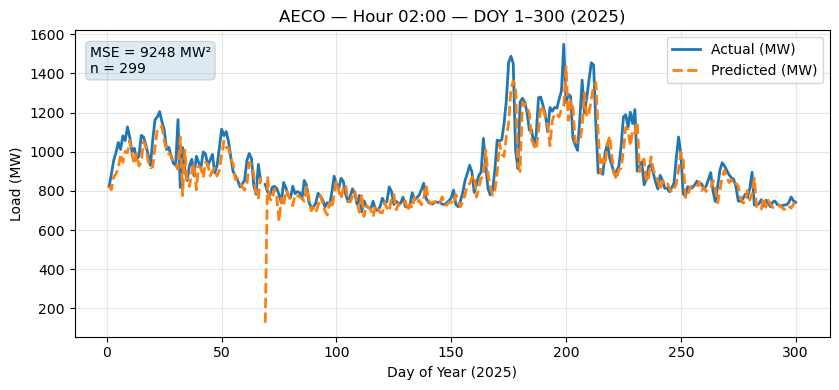

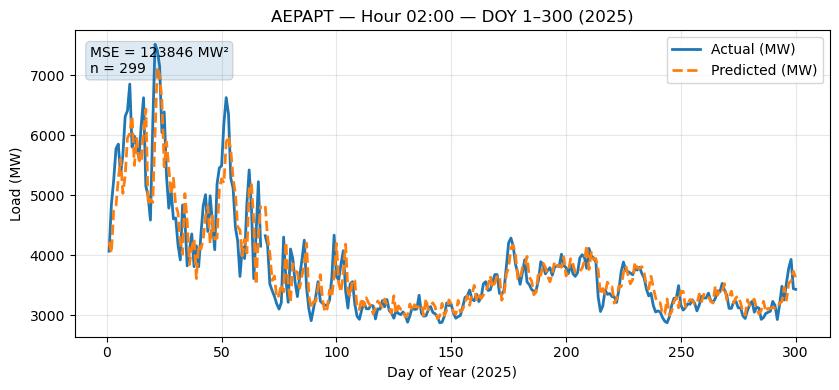

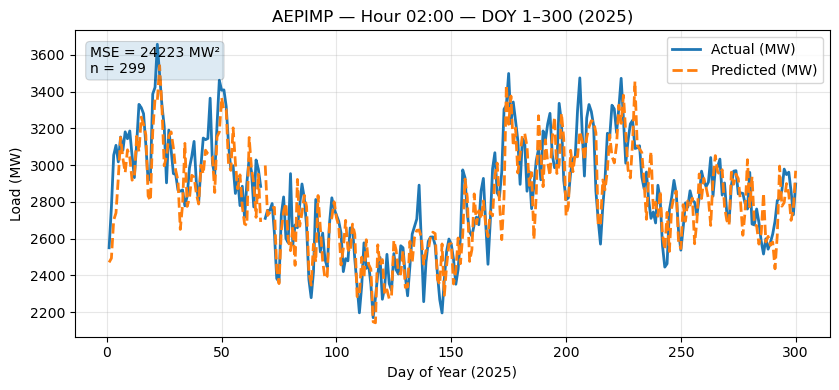

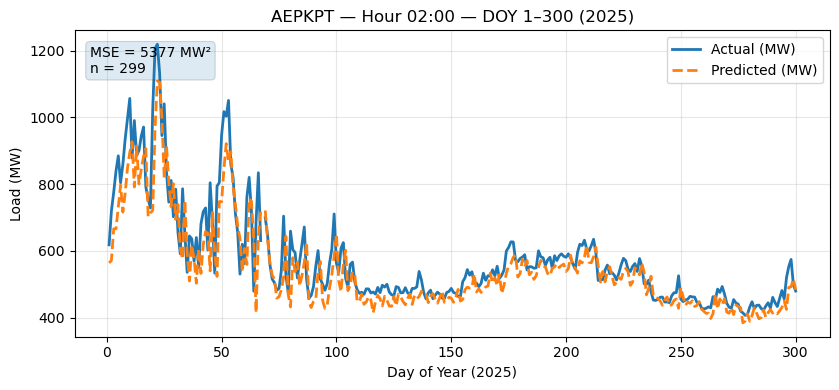

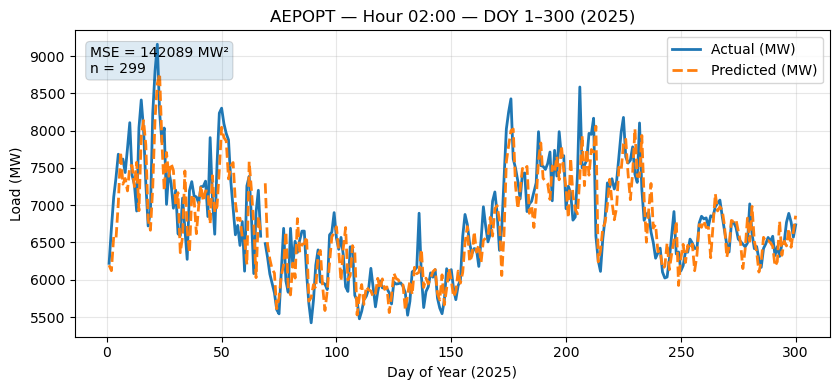

...

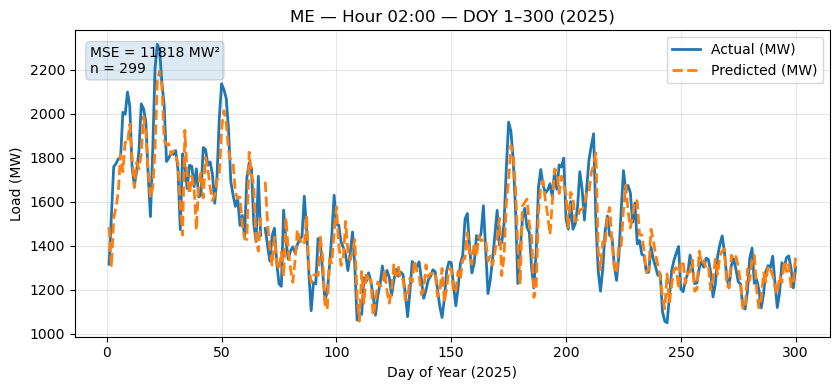

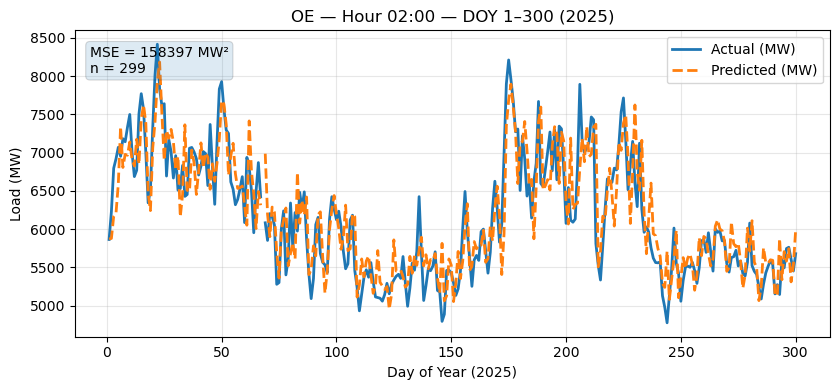

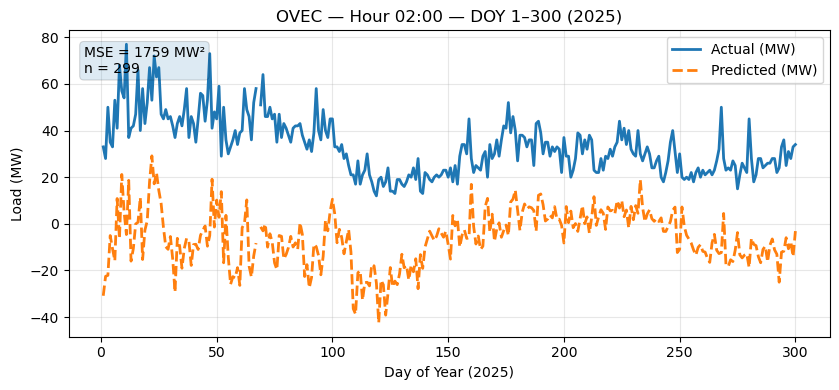

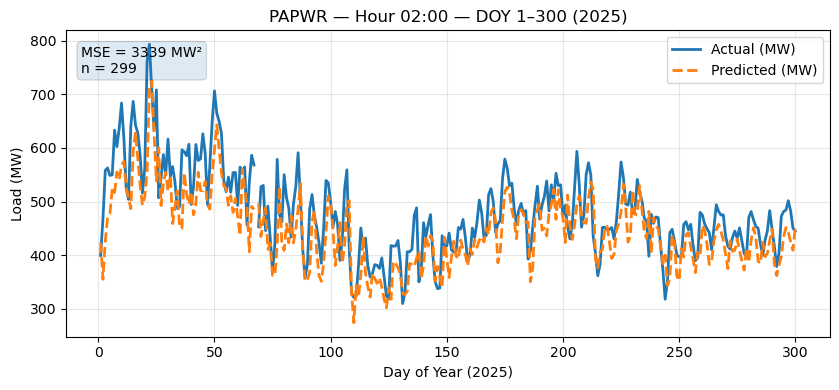

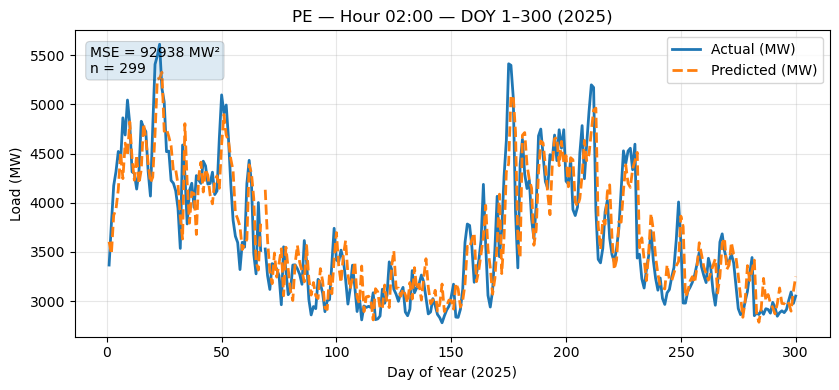

In [130]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 300
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


## +drop outlier

In [133]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Simple metric functions
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Setup — use datetime_beginning_ept directly (already EPT local time)
# -------------------------
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

# Parse as naive datetimes (they already represent EPT wall clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"])

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# Seasonality by day-of-year (keep); hour handled by dummies below
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# Hour dummies: categorical with fixed 0..23 levels
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area (computed on full history so early-2022/2024 rows can use prior-year lags)
df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area")["mw"].shift(48)
df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Ensure consistent categories across splits
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)

# Require features to exist
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# -------------------------
# 2) Train/valid split
# -------------------------
train_df = df[(df["year"] >= 2022) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

# -------------------------
# 2a) DROP OUTLIERS in TRAIN ONLY
#     - LEVEL outliers via robust z (MAD) per (load_area, hour)
#     - CONTINUITY outliers via robust z on delta24 per (load_area, hour)
# -------------------------
# LEVEL outliers
g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
median_lvl = g_lvl.transform("median")
mad_lvl = g_lvl.transform(lambda s: (s - s.median()).abs().median())

# scale: use 1.4826*MAD (≈σ for Normal); fallback to std if MAD==0
scale_lvl = (1.4826 * mad_lvl).where(mad_lvl > 0,
                                     g_lvl.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_level"] = (train_df["mw"] - median_lvl).abs() / scale_lvl
train_df["out_level"] = train_df["z_level"] > 4.0   # <-- tune threshold as needed

# CONTINUITY outliers (big 24h jumps)
train_df["delta24"] = train_df["mw"] - train_df["mw_lag24"]
g_step = train_df.groupby(["load_area", "hour"])["delta24"]
median_step = g_step.transform("median")
mad_step = g_step.transform(lambda s: (s - s.median()).abs().median())

scale_step = (1.4826 * mad_step).where(mad_step > 0,
                                       g_step.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_step"] = (train_df["delta24"] - median_step).abs() / scale_step
train_df["out_step"] = train_df["z_step"] > 6.0      # looser to allow legit ramps

# (Optional) do not filter tiny groups (avoid over-pruning)
counts = train_df.groupby(["load_area", "hour"])["mw"].transform("size")
small_group = counts < 48  # ~2 days worth at that hour
train_df["is_outlier"] = (~small_group) & (train_df["out_level"] | train_df["out_step"])

n_all = len(train_df)
n_drop = int(train_df["is_outlier"].sum())
print(f"[Outlier filter] Dropping {n_drop:,} of {n_all:,} training rows ({n_drop/max(n_all,1):.2%}).")

# Keep only non-outliers for training
train_clean = train_df.loc[~train_df["is_outlier"]].copy()
train_clean = train_clean.sort_values(["load_area", "ts"])

# Recompute lags on CLEANED training so features don't point to removed outliers
train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
train_clean["mw_lag48"]  = train_clean.groupby("load_area")["mw"].shift(48)
train_clean["mw_lag168"] = train_clean.groupby("load_area")["mw"].shift(168)

# Re-assert categorical levels (keeps design matrix stable)
train_clean["hour_cat"]  = pd.Categorical(train_clean["hour"], categories=list(range(24)), ordered=False)
train_clean["dow_name"]  = pd.Categorical(train_clean["dow_name"], categories=dow_order, ordered=True)
train_clean["load_area"] = pd.Categorical(train_clean["load_area"], categories=load_area)

# Ensure all features exist after re-lagging
train_clean = train_clean.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# -------------------------
# 3) Linear model
# -------------------------
formula = """
mw ~ C(load_area)
     + C(dow_name, Treatment(reference="Monday"))
     + C(hour_cat, Treatment(reference=0))
     + temperature_2m
     + sin_doy + cos_doy
     + mw_lag24 + mw_lag168
     + C(dow_name, Treatment(reference="Monday")):C(load_area)
"""

# Fit on CLEANED training set
model = smf.ols(formula=formula, data=train_clean).fit()
print(model.summary())

# -------------------------
# 4) Predict on 2025 (do NOT filter validation!)
# -------------------------
valid_df["pred"] = model.predict(valid_df)

# -------------------------
# 5) Report errors
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
overall_mae  = mae(valid_df["mw"], valid_df["pred"])
overall_mape = mape(valid_df["mw"], valid_df["pred"])

print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area RMSE
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE on 2025:")
print(per_area_rmse)

# Per-hour-of-day RMSE
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE on 2025:")
print(per_hour_rmse)

# (Optional) Save detailed metrics
per_area_rmse.to_csv("metrics_2025_by_load_area.csv", float_format="%.3f")
per_hour_rmse.to_csv("metrics_2025_by_hour.csv", float_format="%.3f")
print("\nSaved: metrics_2025_by_load_area.csv, metrics_2025_by_hour.csv")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:30: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the futur

[Outlier filter] Dropping 4,314 of 552,384 training rows (0.78%).


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:106: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:107: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_clean["mw_lag48"]  = train_clean.groupby("load_area")["mw"].shift(48)
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:108: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pa

                            OLS Regression Results                            
Dep. Variable:                     mw   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                 2.271e+05
Date:                Sat, 15 Nov 2025   Prob (F-statistic):               0.00
Time:                        21:11:14   Log-Likelihood:            -4.0439e+06
No. Observations:              544542   AIC:                         8.088e+06
Df Residuals:                  544367   BIC:                         8.090e+06
Df Model:                         174                                         
Covariance Type:            nonrobust                                         
                                                                                     coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:155: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3545066812.py:165: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


## Best Now

In [402]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Simple metric functions
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Setup — use datetime_beginning_ept directly (already EPT local time)
# -------------------------
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

# Parse as naive datetimes (they already represent EPT wall clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"])

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# Seasonality by day-of-year
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# Hour dummies: categorical with fixed 0..23 levels
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area
df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)

df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Ensure consistent categories across splits
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)

# Require features to exist
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# -------------------------
# 2) Train/valid split
# -------------------------
train_df = df[(df["year"] >= 2022) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

# =========================
# 2a) DROP OUTLIERS in TRAIN ONLY (per area, hour)
# =========================
# LEVEL outliers via robust z (MAD)
g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
median_lvl = g_lvl.transform("median")
mad_lvl = g_lvl.transform(lambda s: (s - s.median()).abs().median())
scale_lvl = (1.4826 * mad_lvl).where(mad_lvl > 0,
                                     g_lvl.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_level"] = (train_df["mw"] - median_lvl).abs() / scale_lvl
train_df["out_level"] = train_df["z_level"] > 4.0

# CONTINUITY outliers via robust z on 24h jump
train_df["delta24"] = train_df["mw"] - train_df["mw_lag24"]
g_step = train_df.groupby(["load_area", "hour"])["delta24"]
median_step = g_step.transform("median")
mad_step = g_step.transform(lambda s: (s - s.median()).abs().median())
scale_step = (1.4826 * mad_step).where(mad_step > 0,
                                       g_step.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_step"] = (train_df["delta24"] - median_step).abs() / scale_step
train_df["out_step"] = train_df["z_step"] > 6.0

# avoid over-pruning tiny groups
counts = train_df.groupby(["load_area", "hour"])["mw"].transform("size")
small_group = counts < 48
train_df["is_outlier"] = (~small_group) & (train_df["out_level"] | train_df["out_step"])

print(f"[Outlier filter] Dropping {int(train_df['is_outlier'].sum()):,} of {len(train_df):,} training rows.")

# Clean training and recompute lags (so lags don't point to dropped rows)
train_clean = train_df.loc[~train_df["is_outlier"]].copy()
train_clean = train_clean.sort_values(["load_area", "ts"])

train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
train_clean["mw_lag48"]  = train_clean.groupby("load_area")["mw"].shift(48)
train_clean["mw_lag168"] = train_clean.groupby("load_area")["mw"].shift(168)
train_clean = train_clean.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# Keep categorical levels stable
train_clean["hour_cat"]  = pd.Categorical(train_clean["hour"], categories=list(range(24)), ordered=False)
train_clean["dow_name"]  = pd.Categorical(train_clean["dow_name"], categories=dow_order, ordered=True)
train_clean["load_area"] = pd.Categorical(train_clean["load_area"], categories=load_area)

# -------------------------
# 3) MODELS
# -------------------------
# SPECIAL areas use lag-only models
special_areas = ["EASTON", "OVEC"]

# ---- Global formula for non-special areas
formula_global = """
mw ~ C(load_area)
     + C(hour_cat, Treatment(reference=0))
     + temperature_2m
     + sin_doy + cos_doy
     + mw_lag24 + mw_lag168 
     + C(dow_name, Treatment(reference="Monday")):C(load_area)
"""

# Split training
train_non = train_clean[~train_clean["load_area"].isin(special_areas)].copy()
train_eas = train_clean[train_clean["load_area"] == "EASTON"].copy()
train_ovc = train_clean[train_clean["load_area"] == "OVEC"].copy()
train_aepkt = train_clean[train_clean["load_area"] == "AEPKT"].copy()

# Make sure categorical levels for the global model contain only observed categories to avoid zero-columns
if not train_non.empty:
    train_non["load_area"] = train_non["load_area"].cat.remove_unused_categories()

# ---- Fit models
model_global = None
if not train_non.empty:
    model_global = smf.ols(formula=formula_global, data=train_non).fit()
    print("[Model] Fitted GLOBAL model on non-special areas.")

# lag-only formula for special areas
formula_lag_only = "mw ~ mw_lag24 + mw_lag168"

model_easton = None
if not train_eas.empty:
    model_easton = smf.ols(formula=formula_lag_only, data=train_eas).fit()
    print("[Model] Fitted EASTON lag-only model.")

model_ovec = None
if not train_ovc.empty:
    model_ovec = smf.ols(formula=formula_lag_only, data=train_ovc).fit()
    print("[Model] Fitted OVEC lag-only model.")

model_aepkt = None
if not train_eas.empty:
    model_easton = smf.ols(formula=formula_lag_only, data=train_eas).fit()
    print("[Model] Fitted EASTON lag-only model.")

# -------------------------
# 4) Predict on 2025
# -------------------------
valid_df = valid_df.copy()
valid_df["pred"] = np.nan

mask_non = ~valid_df["load_area"].isin(special_areas)
mask_eas = valid_df["load_area"] == "EASTON"
mask_ovc = valid_df["load_area"] == "OVEC"

# keep category set consistent for the global predict slice
if mask_non.any() and model_global is not None:
    valid_non = valid_df.loc[mask_non].copy()
    # Align categories to training global categories (important if you removed unused)
    valid_non["load_area"] = pd.Categorical(
        valid_non["load_area"],
        categories=train_non["load_area"].cat.categories
    )
    valid_df.loc[mask_non, "pred"] = model_global.predict(valid_non)

if mask_eas.any() and model_easton is not None:
    valid_df.loc[mask_eas, "pred"] = model_easton.predict(valid_df.loc[mask_eas])

if mask_ovc.any() and model_ovec is not None:
    valid_df.loc[mask_ovc, "pred"] = model_ovec.predict(valid_df.loc[mask_ovc])

# -------------------------
# 5) Report errors
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
overall_mae  = mae(valid_df["mw"], valid_df["pred"])
overall_mape = mape(valid_df["mw"], valid_df["pred"])

print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area RMSE
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE on 2025:")
print(per_area_rmse)

# Per-hour-of-day RMSE
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE on 2025:")
print(per_hour_rmse)

# (Optional) Save detailed metrics
per_area_rmse.to_csv("metrics_2025_by_load_area.csv", float_format="%.3f")
per_hour_rmse.to_csv("metrics_2025_by_hour.csv", float_format="%.3f")
print("\nSaved: metrics_2025_by_load_area.csv, metrics_2025_by_hour.csv")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1142420357.py:30: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1142420357.py:69: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1142420357.py:79: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the futur

[Outlier filter] Dropping 7,060 of 736,512 training rows.
[Model] Fitted GLOBAL model on non-special areas.
[Model] Fitted EASTON lag-only model.
[Model] Fitted OVEC lag-only model.
[Model] Fitted EASTON lag-only model.
Validation (2025) overall:
  RMSE: 383.03 MW
  MAE : 206.73 MW
  MAPE: 9.83%

Per-load_area RMSE on 2025:
               RMSE_MW
load_area             
EASTON        3.939778
OVEC          9.448667
VMEU         47.817602
RECO         50.825225
PAPWR        63.297754
SMECO        72.936972
AEPKPT       73.129464
PN          120.689100
DUQ         121.276049
ME          141.724255
AECO        147.567653
DAY         157.752035
AEPIMP      191.843589
EKPC        212.658380
DPLCO       239.137423
DEOK        239.547596
PEPCO       269.034629
PLCO        337.797574
JC          339.076937
AEPAPT      346.997661
BC          354.101768
AP          413.265305
PE          413.326848
AEPOPT      449.631210
OE          484.622943
PS          516.996805
CE          980.020772
DOM    

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1142420357.py:200: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1142420357.py:210: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


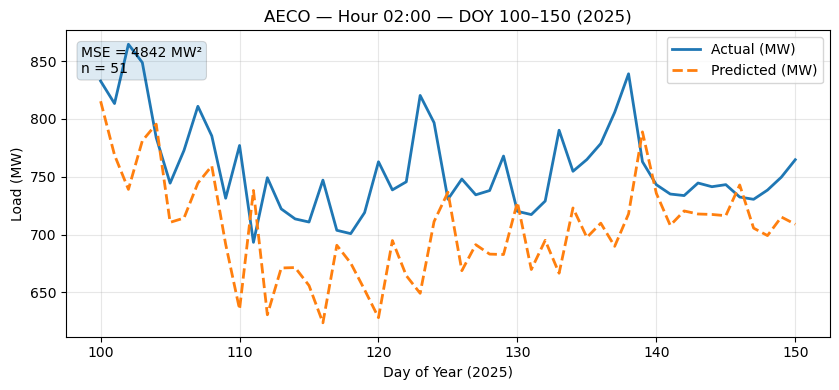

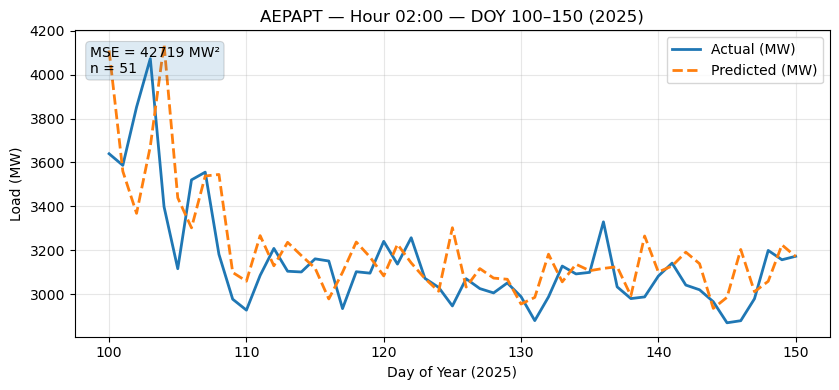

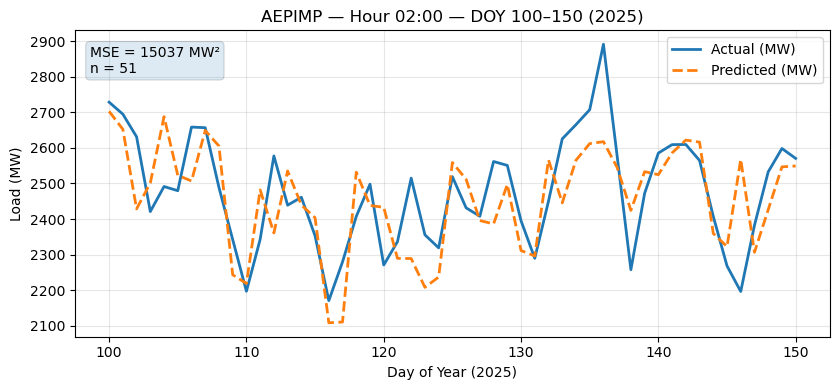

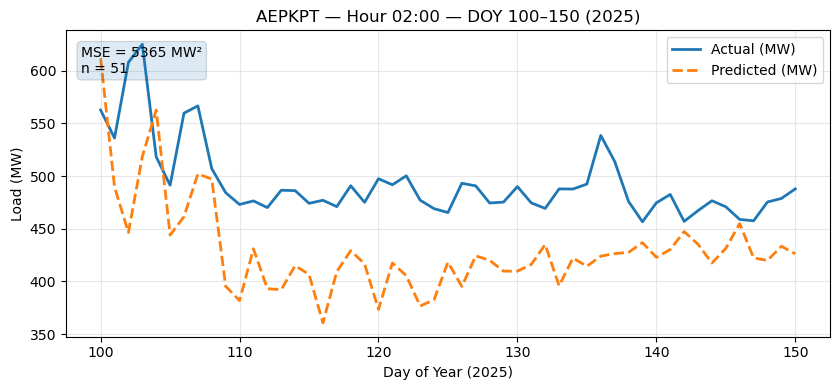

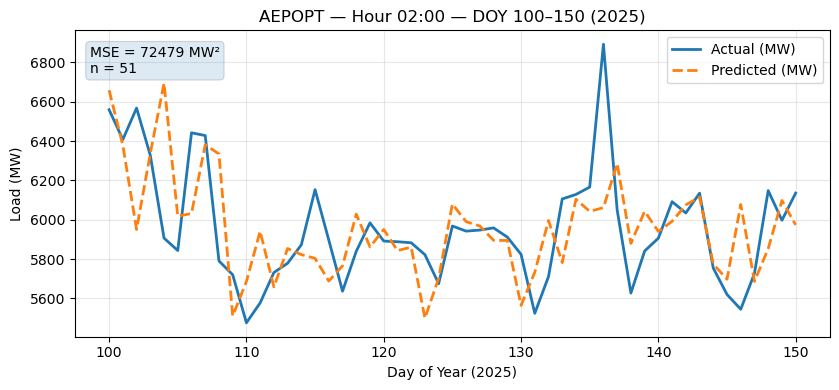

...

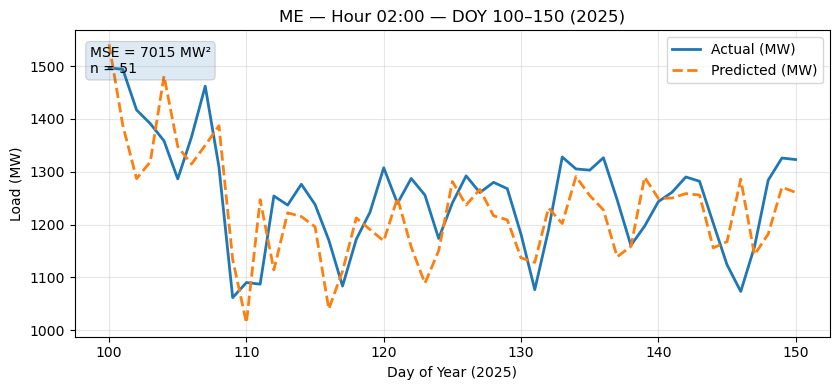

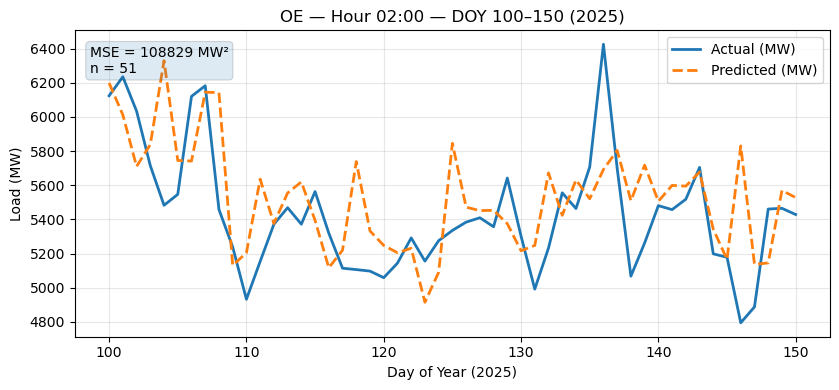

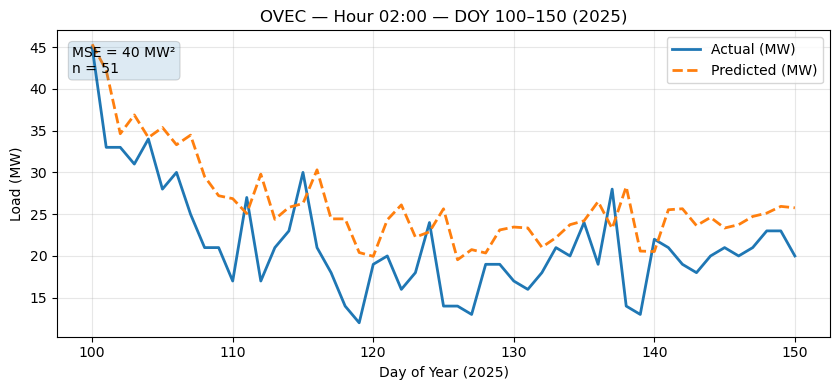

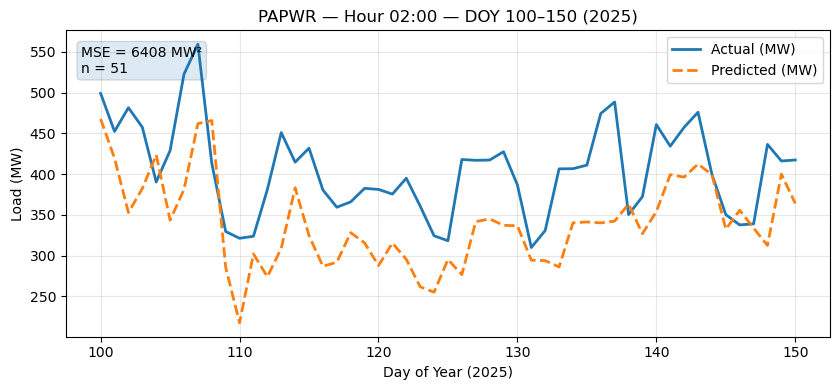

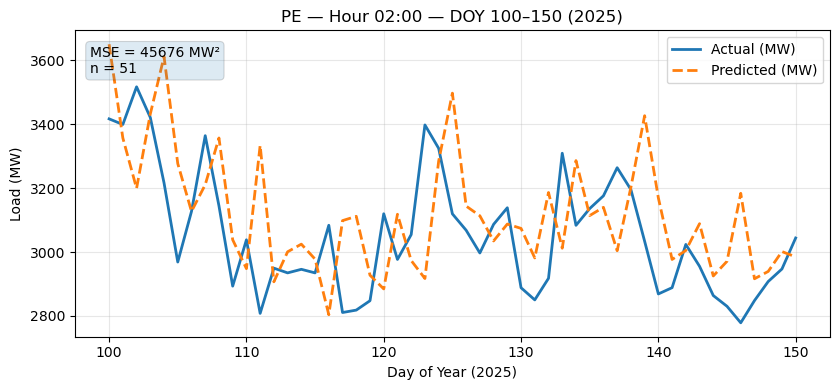

In [232]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 100, 150
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


## Best Now V2

In [299]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Simple metric functions
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Setup — use datetime_beginning_ept directly (already EPT local time)
# -------------------------
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()

# Parse as naive datetimes (they already represent EPT wall clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"])

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# Seasonality by day-of-year
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# Hour dummies: categorical with fixed 0..23 levels
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area
df["mw_lag1"]  = df.groupby("load_area")["mw"].shift(1)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)

df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Ensure consistent categories across splits
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)

# Require features to exist
df = df.dropna(subset=["mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# -------------------------
# 2) Train/valid split
# -------------------------
train_df = df[(df["year"] >= 2022) & (df["year"] <= 2024)].copy()
valid_df = df[df["year"] == 2025].copy()

# =========================
# 2a) DROP OUTLIERS in TRAIN ONLY (per area, hour)
# =========================
# LEVEL outliers via robust z (MAD)
g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
median_lvl = g_lvl.transform("median")
mad_lvl = g_lvl.transform(lambda s: (s - s.median()).abs().median())
scale_lvl = (1.4826 * mad_lvl).where(mad_lvl > 0,
                                     g_lvl.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_level"] = (train_df["mw"] - median_lvl).abs() / scale_lvl
train_df["out_level"] = train_df["z_level"] > 4.0

# CONTINUITY outliers via robust z on 24h jump
train_df["delta24"] = train_df["mw"] - train_df["mw_lag24"]
g_step = train_df.groupby(["load_area", "hour"])["delta24"]
median_step = g_step.transform("median")
mad_step = g_step.transform(lambda s: (s - s.median()).abs().median())
scale_step = (1.4826 * mad_step).where(mad_step > 0,
                                       g_step.transform("std").replace(0, np.nan)).fillna(1e-6)
train_df["z_step"] = (train_df["delta24"] - median_step).abs() / scale_step
train_df["out_step"] = train_df["z_step"] > 6.0

# avoid over-pruning tiny groups
counts = train_df.groupby(["load_area", "hour"])["mw"].transform("size")
small_group = counts < 48
train_df["is_outlier"] = (~small_group) & (train_df["out_level"] | train_df["out_step"])

print(f"[Outlier filter] Dropping {int(train_df['is_outlier'].sum()):,} of {len(train_df):,} training rows.")

# Clean training and recompute lags (so lags don't point to dropped rows)
train_clean = train_df.loc[~train_df["is_outlier"]].copy()
train_clean = train_clean.sort_values(["load_area", "ts"])
train_clean["mw_lag1"]  = train_clean.groupby("load_area")["mw"].shift(1)
train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
train_clean["mw_lag48"]  = train_clean.groupby("load_area")["mw"].shift(48)
train_clean["mw_lag168"] = train_clean.groupby("load_area")["mw"].shift(168)
train_clean = train_clean.dropna(subset=["mw_lag1","mw_lag24", "mw_lag168", "temperature_2m"]).copy()

# Keep categorical levels stable
train_clean["hour_cat"]  = pd.Categorical(train_clean["hour"], categories=list(range(24)), ordered=False)
train_clean["dow_name"]  = pd.Categorical(train_clean["dow_name"], categories=dow_order, ordered=True)
train_clean["load_area"] = pd.Categorical(train_clean["load_area"], categories=load_area)

# -------------------------
# 3) MODELS
# -------------------------
# SPECIAL areas use lag-only models
special_areas = ["EASTON", "OVEC", "AEPKT"]

# ---- Global formula for non-special areas
formula_global = """
mw ~ C(load_area)
     + C(hour_cat, Treatment(reference=0))
     + temperature_2m
     + sin_doy + cos_doy
     + mw_lag1 + mw_lag24 + mw_lag168 
     + C(dow_name, Treatment(reference="Monday")):C(load_area)
"""

# Split training
train_non = train_clean[~train_clean["load_area"].isin(special_areas)].copy()
train_eas = train_clean[train_clean["load_area"] == "EASTON"].copy()
train_ovc = train_clean[train_clean["load_area"] == "OVEC"].copy()
train_aepkt = train_clean[train_clean["load_area"] == "AEPKT"].copy()

# Make sure categorical levels for the global model contain only observed categories to avoid zero-columns
if not train_non.empty:
    train_non["load_area"] = train_non["load_area"].cat.remove_unused_categories()

# ---- Fit models
model_global = None
if not train_non.empty:
    model_global = smf.ols(formula=formula_global, data=train_non).fit()
    print("[Model] Fitted GLOBAL model on non-special areas.")

# lag-only formula for special areas
formula_lag_only = "mw ~ mw_lag1 + mw_lag24 + mw_lag168"

model_easton = None
if not train_eas.empty:
    model_easton = smf.ols(formula=formula_lag_only, data=train_eas).fit()
    print("[Model] Fitted EASTON lag-only model.")

model_ovec = None
if not train_ovc.empty:
    model_ovec = smf.ols(formula=formula_lag_only, data=train_ovc).fit()
    print("[Model] Fitted OVEC lag-only model.")

model_aepkt = None
if not train_eas.empty:
    model_easton = smf.ols(formula=formula_lag_only, data=train_eas).fit()
    print("[Model] Fitted EASTON lag-only model.")

# -------------------------
# 4) Predict on 2025
# -------------------------
valid_df = valid_df.copy()
valid_df["pred"] = np.nan

mask_non = ~valid_df["load_area"].isin(special_areas)
mask_eas = valid_df["load_area"] == "EASTON"
mask_ovc = valid_df["load_area"] == "OVEC"

# keep category set consistent for the global predict slice
if mask_non.any() and model_global is not None:
    valid_non = valid_df.loc[mask_non].copy()
    # Align categories to training global categories (important if you removed unused)
    valid_non["load_area"] = pd.Categorical(
        valid_non["load_area"],
        categories=train_non["load_area"].cat.categories
    )
    valid_df.loc[mask_non, "pred"] = model_global.predict(valid_non)

if mask_eas.any() and model_easton is not None:
    valid_df.loc[mask_eas, "pred"] = model_easton.predict(valid_df.loc[mask_eas])

if mask_ovc.any() and model_ovec is not None:
    valid_df.loc[mask_ovc, "pred"] = model_ovec.predict(valid_df.loc[mask_ovc])

# -------------------------
# 5) Report errors
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
overall_mae  = mae(valid_df["mw"], valid_df["pred"])
overall_mape = mape(valid_df["mw"], valid_df["pred"])

print("Validation (2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area RMSE
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE on 2025:")
print(per_area_rmse)

# Per-hour-of-day RMSE
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE on 2025:")
print(per_hour_rmse)

# (Optional) Save detailed metrics
per_area_rmse.to_csv("metrics_2025_by_load_area.csv", float_format="%.3f")
per_hour_rmse.to_csv("metrics_2025_by_hour.csv", float_format="%.3f")
print("\nSaved: metrics_2025_by_load_area.csv, metrics_2025_by_hour.csv")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:30: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:71: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g_lvl = train_df.groupby(["load_area", "hour"])["mw"]
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:81: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future d

[Outlier filter] Dropping 4,314 of 552,384 training rows.


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:99: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_clean["mw_lag1"]  = train_clean.groupby("load_area")["mw"].shift(1)
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:100: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  train_clean["mw_lag24"]  = train_clean.groupby("load_area")["mw"].shift(24)
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:101: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass obs

[Model] Fitted GLOBAL model on non-special areas.
[Model] Fitted EASTON lag-only model.
[Model] Fitted OVEC lag-only model.
[Model] Fitted EASTON lag-only model.
Validation (2025) overall:
  RMSE: 148.56 MW
  MAE : 90.48 MW
  MAPE: 4.21%

Per-load_area RMSE on 2025:
              RMSE_MW
load_area            
EASTON       1.573860
OVEC         4.972549
ME          64.818257
DAY         67.535437
DUQ         75.450977
DEOK        79.121718
AEPIMP      79.496301
AECO        83.665376
DPLCO       86.611769
PAPWR       87.926447
AEPKPT      89.405618
EKPC        93.800324
BC         106.622203
JC         106.987509
AEPAPT     111.394719
PE         117.802660
AP         133.746685
AEPOPT     159.400533
OE         172.923056
CE         325.527077
DOM        411.237767

Per-hour-of-day RMSE on 2025:
         RMSE_MW
hour            
0     164.144888
1     134.230319
2     102.535236
3      86.680016
4      78.532610
5     119.432185
6     172.075231
7     154.744466
8     165.805959
9     199

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:202: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/440910595.py:212: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


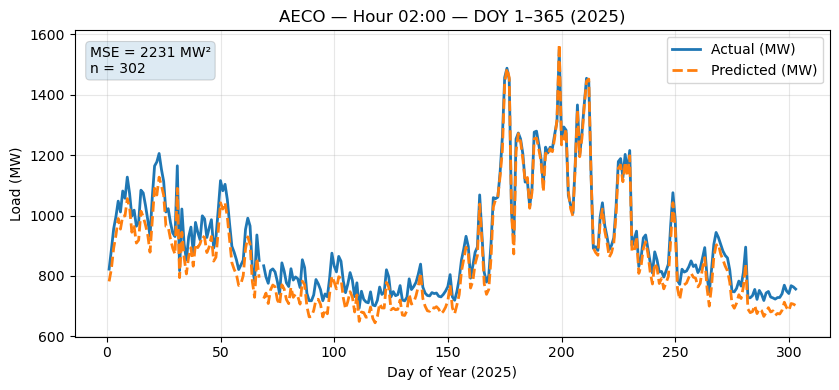

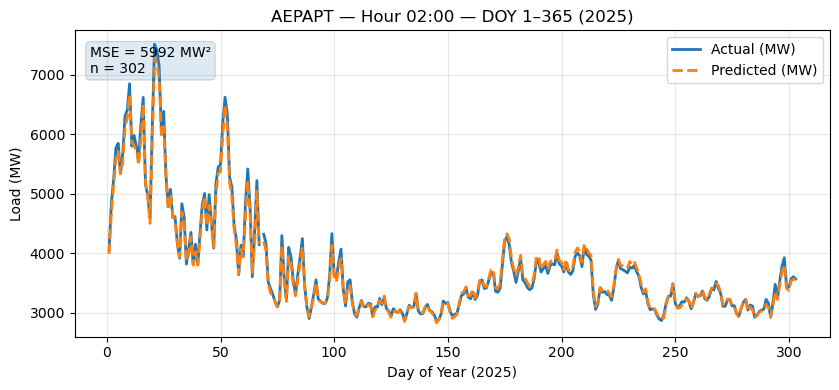

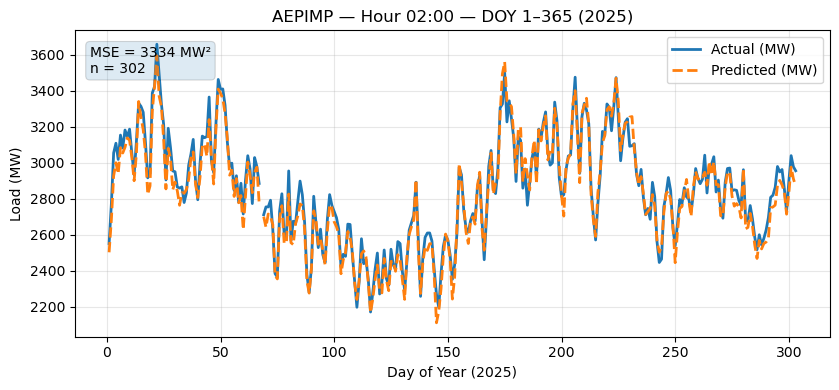

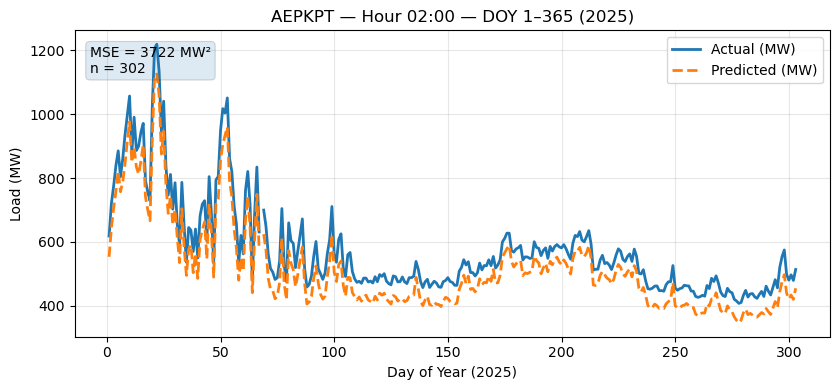

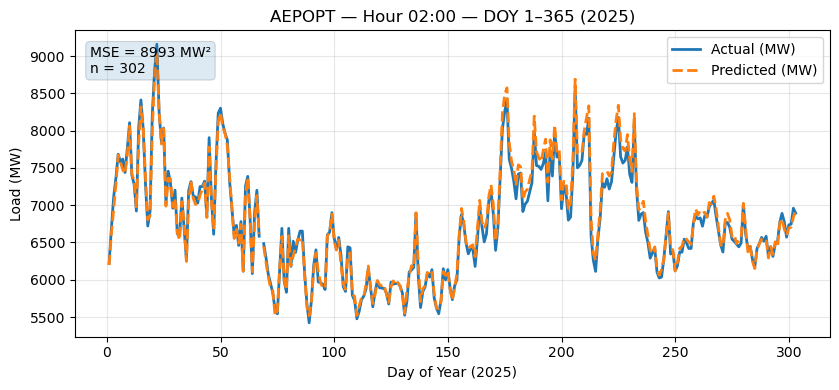

...

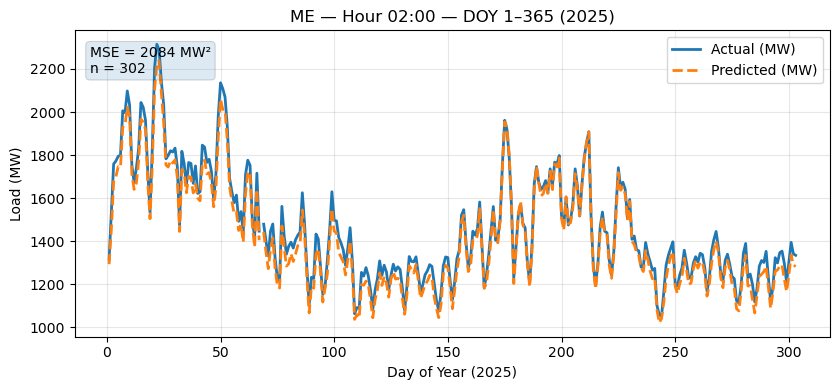

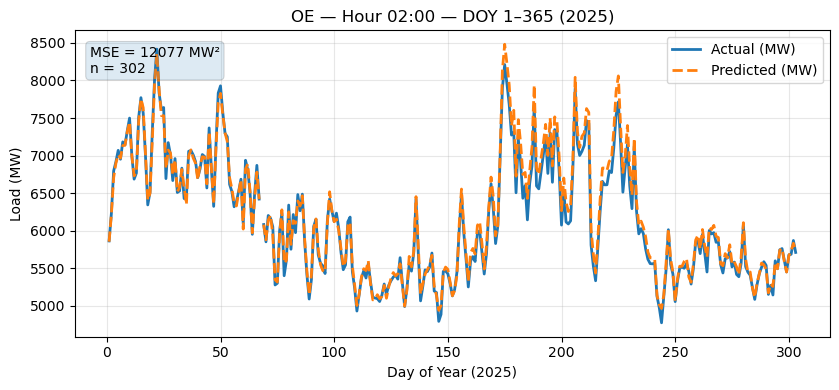

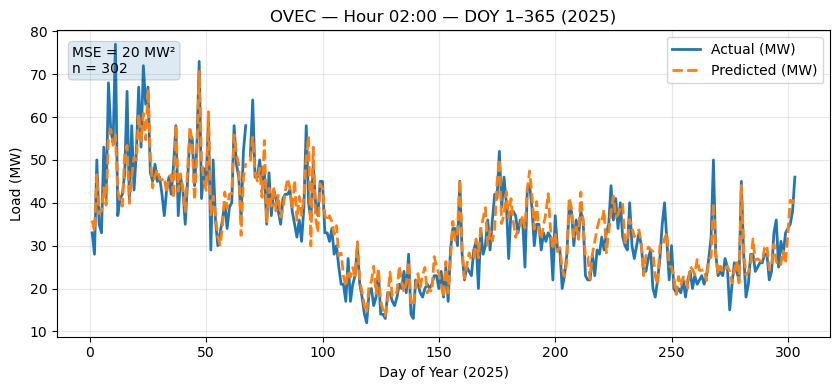

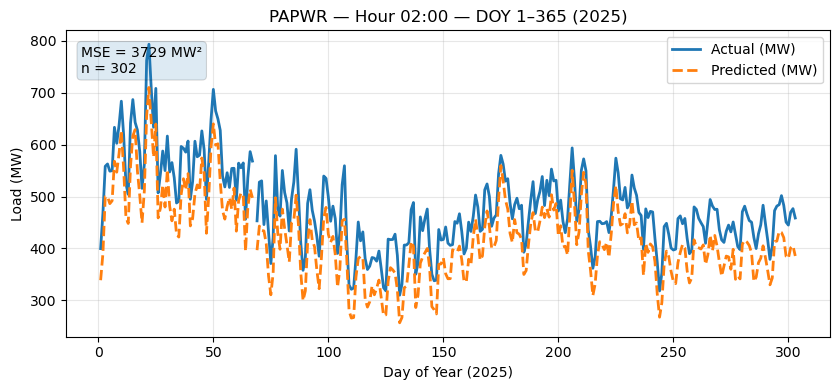

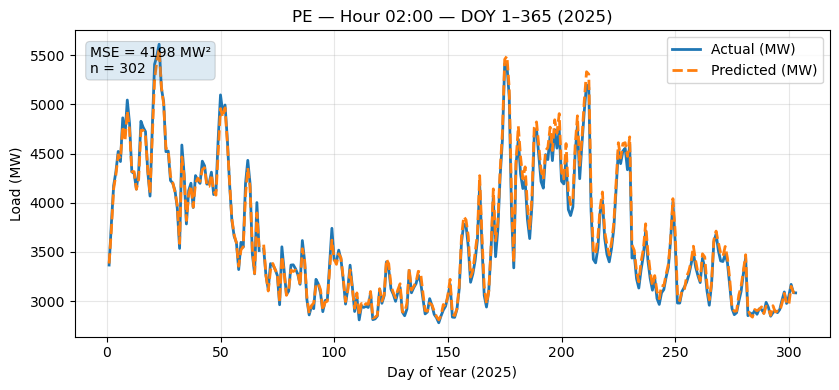

In [303]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 365
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


In [309]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

# -------------------------
# Metrics
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Setup — build features for all areas
# -------------------------
df = merged_df.copy()
df = df[df["load_area"].isin(load_area)].copy()



# Parse PJM EPT timestamps (already local wall-clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour

# Lag features (within area)
df["mw_lag24"]  = df.groupby("load_area", observed=True)["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area", observed=True)["mw"].shift(48)


df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# Seasonality by day-of-year
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# Hour dummies: categorical with fixed 0..23 levels
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area
df["mw_lag1"]  = df.groupby("load_area")["mw"].shift(1)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)

df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# Ensure consistent categories across splits
df["load_area"] = pd.Categorical(df["load_area"], categories=load_area)



# ---- same calendar day & hour from the past 4 years (mw_ly1..mw_ly4)
def add_last_year_feats(frame: pd.DataFrame, n_years: int = 4) -> pd.DataFrame:
    out = frame
    # average any duplicate (load_area, ts) rows (DST fall-back safety)
    base = (frame[["load_area", "ts", "mw"]]
            .groupby(["load_area", "ts"], as_index=False)["mw"].mean())
    for k in range(1, n_years + 1):
        prev = base.rename(columns={"mw": f"mw_ly{k}"}).copy()
        # align prior year's value to the "current" timestamp by shifting forward k years
        prev["ts"] = prev["ts"] + pd.DateOffset(years=k)
        out = out.merge(prev, on=["load_area", "ts"], how="left")
    return out

df = add_last_year_feats(df, n_years=4)

# We only need lag24, lag48 and mw_ly1..4 for this model
need_all = ["mw_lag24", "mw_lag48", "mw_ly1", "mw_ly2", "mw_ly3", "mw_ly4"]
df = df.dropna(subset=need_all + ["mw"]).copy()

# -------------------------
# 2) Split: train on ALL data except the week of Oct 31, 2025;
#           validate on that week only.
#    (Week = Monday..Sunday containing 2025-10-31)
# -------------------------
week_anchor = pd.Timestamp("2025-10-31")
week_start  = week_anchor - pd.Timedelta(days=week_anchor.weekday())  # Monday 2025-10-27
week_end    = week_start + pd.Timedelta(days=7)                       # Monday 2025-11-03 (exclusive)

train_df = df[(df["ts"] < week_start) | (df["ts"] >= week_end)].copy()
valid_df = df[(df["ts"] >= week_start) & (df["ts"] < week_end)].copy()

print(f"Training span: {train_df['ts'].min()} → {train_df['ts'].max()} (excludes {week_start.date()}..{(week_end - pd.Timedelta(seconds=1)).date()})")
print(f"Validation span: {valid_df['ts'].min()} → {valid_df['ts'].max()}")

# -------------------------
# 3) OLS with ONLY requested predictors (global model, all areas & hours)
# -------------------------
formula = "mw ~ mw_lag24 + mw_lag48 + mw_ly1 + mw_ly2 + mw_ly3 + mw_ly4"
model = smf.ols(formula=formula, data=train_df).fit()
print(model.summary())

# -------------------------
# 4) Predict on the validation week (Oct 27–Nov 2, 2025)
# -------------------------
valid_df["pred"] = model.predict(valid_df)

# -------------------------
# 5) Metrics
# -------------------------
overall_rmse = rmse(valid_df["mw"], valid_df["pred"])
overall_mae  = mae(valid_df["mw"], valid_df["pred"])
overall_mape = mape(valid_df["mw"], valid_df["pred"])

print("\nValidation (week of Oct 31, 2025) overall:")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area RMSE
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE (validation week):")
print(per_area_rmse)

# Per-hour-of-day RMSE
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"], d["pred"]))
            .to_frame("RMSE_MW")
)
print("\nPer-hour-of-day RMSE (validation week):")
print(per_hour_rmse)

# -------------------------
# 6) Optionally persist metrics/predictions
# -------------------------
# per_area_rmse.to_csv("metrics_valweek_by_load_area.csv", float_format="%.3f")
# per_hour_rmse.to_csv("metrics_valweek_by_hour.csv", float_format="%.3f")
# valid_df.to_csv("predictions_valweek_oct31_2025.csv", index=False, float_format="%.3f")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1663603529.py:32: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1663603529.py:75: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(["load_area", "ts"], as_index=False)["mw"].mean())


Training span: 2020-01-01 00:00:00 → 2025-10-26 23:00:00 (excludes 2025-10-27..2025-11-02)
Validation span: 2025-10-27 00:00:00 → 2025-10-30 23:00:00
                            OLS Regression Results                            
Dep. Variable:                     mw   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 1.097e+07
Date:                Sun, 16 Nov 2025   Prob (F-statistic):               0.00
Time:                        04:02:49   Log-Likelihood:            -7.7776e+06
No. Observations:             1037659   AIC:                         1.556e+07
Df Residuals:                 1037652   BIC:                         1.556e+07
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1663603529.py:131: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/1663603529.py:141: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"], d["pred"]))


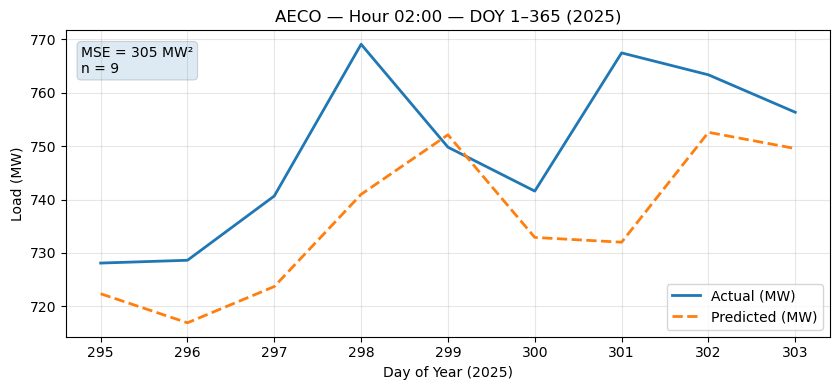

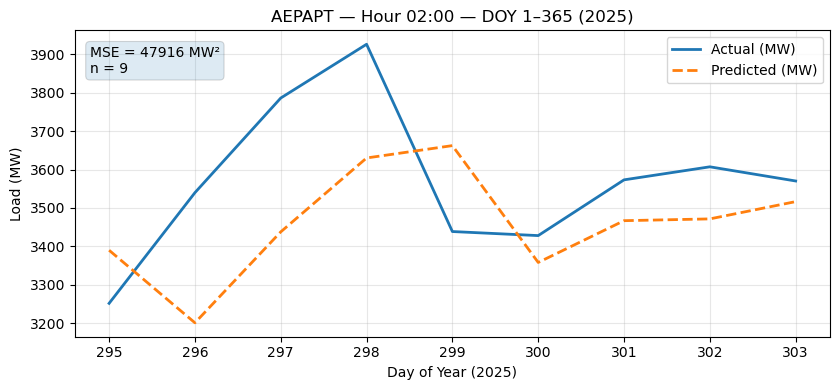

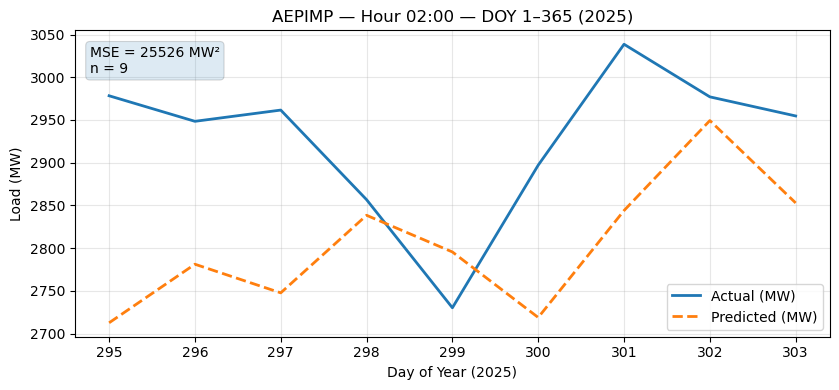

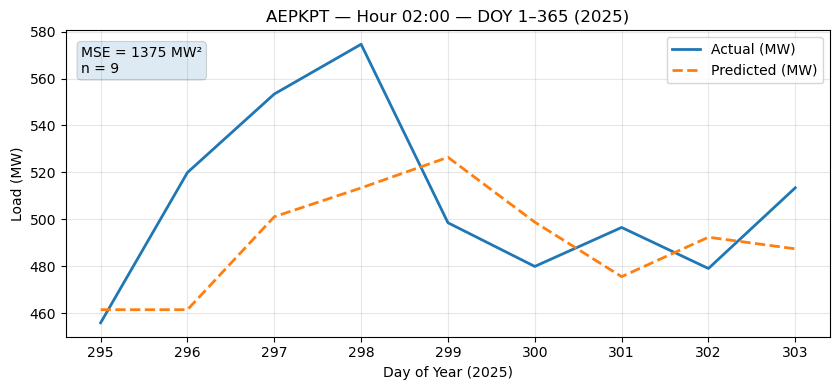

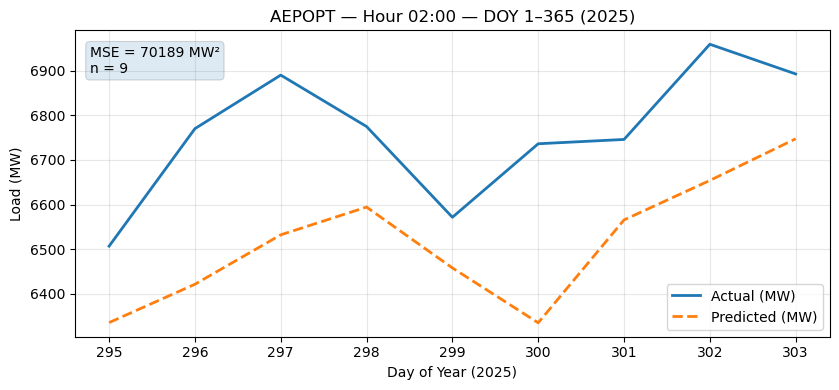

...

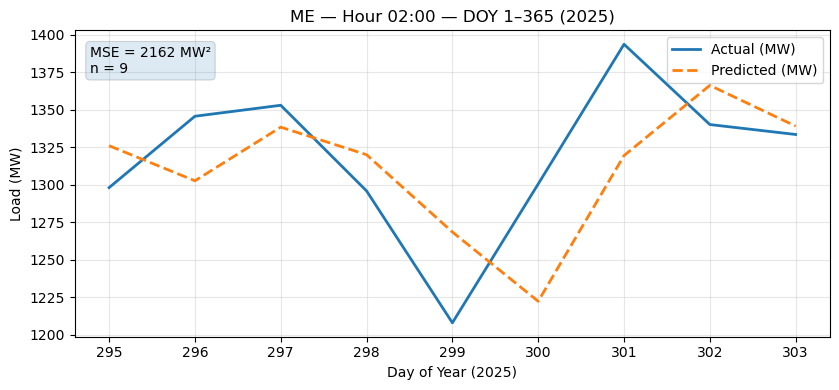

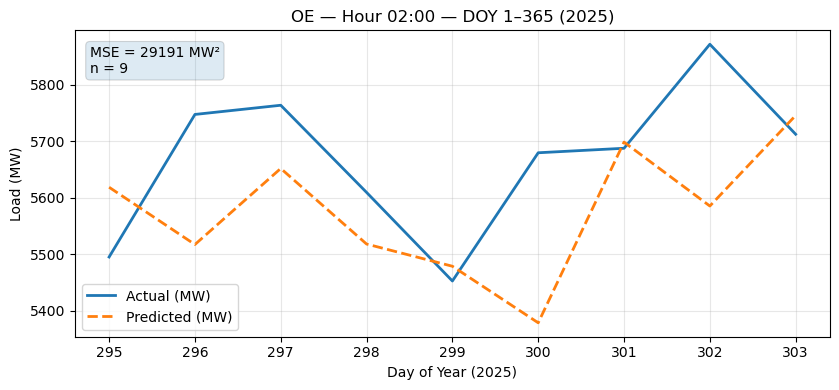

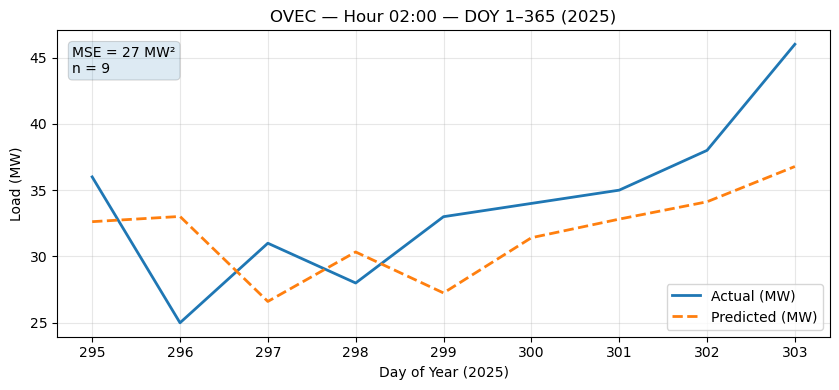

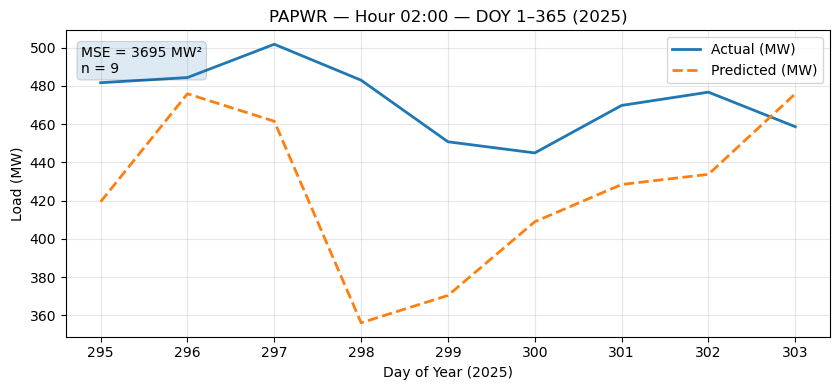

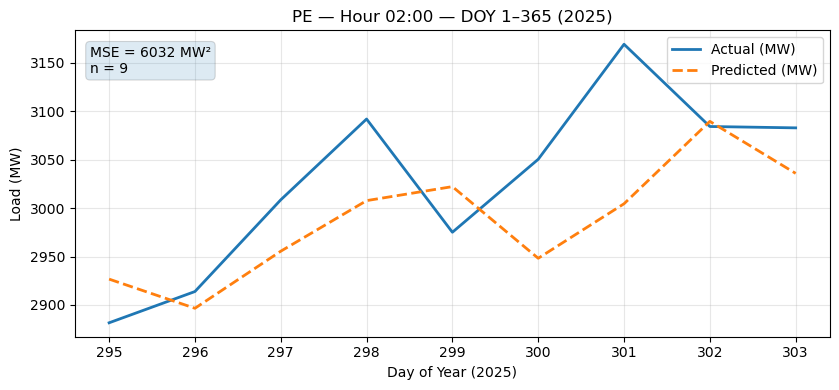

In [368]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 365
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


## Boosting 

In [404]:
import numpy as np
import pandas as pd

# Use scikit-learn's built-in gradient boosting (fast, no extra deps)
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.metrics import mean_absolute_error

# ------------------------------------------------------------
# Config: validation = the MON–SUN week that contains Oct 31, 2025
# ------------------------------------------------------------
VAL_CENTER = pd.Timestamp("2025-10-31")                          # Friday
VAL_START  = VAL_CENTER.to_period("W-MON").start_time            # Monday start of that week
VAL_END    = VAL_START + pd.Timedelta(days=7)                    # exclusive end
print(f"Validation window: {VAL_START}  →  {VAL_END} (week of Oct 31, 2025)")

# ------------------------------------------------------------
# Metrics
# ------------------------------------------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred) ** 2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# ------------------------------------------------------------
# 1) Base frame from your merged_df (all areas you want)
# ------------------------------------------------------------
df = merged_df.copy()
if 'load_area' in globals():  # keep your area subset if provided
    df = df[df["load_area"].isin(load_area)].copy()

# Parse timestamps (already EPT wall clock), sort
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)

# Useful columns
df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour

# ------------------------------------------------------------
# 2) Lag features (per area)
# ------------------------------------------------------------
df["mw_lag24"] = df.groupby("load_area", observed=True)["mw"].shift(24)
df["mw_lag48"] = df.groupby("load_area", observed=True)["mw"].shift(48)



# Parse PJM EPT timestamps (already local wall-clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)

df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour

# Lag features (within area)
df["mw_lag24"]  = df.groupby("load_area", observed=True)["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area", observed=True)["mw"].shift(48)


df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear

# Day-of-week (named) dummies from EPT-local timestamps
dow_order = ["Monday","Tuesday","Wednesday","Thursday","Friday","Saturday","Sunday"]
df["dow_name"] = pd.Categorical(df["ts"].dt.day_name(), categories=dow_order, ordered=True)

# Seasonality by day-of-year
df["sin_doy"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["cos_doy"]  = np.cos(2*np.pi*df["doy"]/365.25)

# Hour dummies: categorical with fixed 0..23 levels
df["hour_cat"] = pd.Categorical(df["hour"], categories=list(range(24)), ordered=False)

# Lags per area
df["mw_lag1"]  = df.groupby("load_area")["mw"].shift(1)

df["mw_lag24"]  = df.groupby("load_area")["mw"].shift(24)

df["mw_lag168"] = df.groupby("load_area")["mw"].shift(168)

# ------------------------------------------------------------
# 3) Same calendar day & hour last 1..4 years (per area)
#    Align prior years to the "current" timestamp and merge by ['load_area','ts'].
# ------------------------------------------------------------
def add_last_year_feats(frame: pd.DataFrame, n_years=4) -> pd.DataFrame:
    out = frame
    # average any duplicate (load_area, ts) rows (DST fall-back safety)
    base = (frame[["load_area", "ts", "mw"]]
            .groupby(["load_area", "ts"], as_index=False)["mw"].mean())
    for k in range(1, n_years + 1):
        prev = base.rename(columns={"mw": f"mw_ly{k}"}).copy()
        # shift prior year's value forward to align with current timestamp
        prev["ts"] = prev["ts"] + pd.DateOffset(years=k)
        out = out.merge(prev, on=["load_area", "ts"], how="left")
    return out

df = add_last_year_feats(df, n_years=4)

# Keep only rows where all predictors for the model exist
feat_cols = ["mw_lag24", "mw_lag48", "mw_ly1", "mw_ly2", "mw_ly3", "mw_ly4"]
df = df.dropna(subset=feat_cols + ["mw"]).copy()

# ------------------------------------------------------------
# 4) Split: validation = week containing Oct 31, 2025; training = everything else
#    (This uses *all* other timestamps, including those after the validation week.)
#    If you want strictly "past-only" training, use: train_df = df[df['ts'] < VAL_START].copy()
# ------------------------------------------------------------
is_val = (df["ts"] >= VAL_START) & (df["ts"] < VAL_END)
is_train = (df["ts"] < VAL_START) & (df['year']>=2024)
valid_df = df.loc[is_val].copy()
train_df = df.loc[~is_val].copy()

print(f"Training rows: {len(train_df):,} | Validation rows: {len(valid_df):,}")

# ------------------------------------------------------------
# 5) Boosting model (global, all areas & hours): HistGradientBoostingRegressor
#    Uses only lag24, lag48, and last-year same-day/hour features
# ------------------------------------------------------------
X_train = train_df[feat_cols].to_numpy()
y_train = train_df["mw"].to_numpy()

X_valid = valid_df[feat_cols].to_numpy()
y_valid = valid_df["mw"].to_numpy()

hgb = HistGradientBoostingRegressor(
    loss="squared_error",
    learning_rate=0.05,
    max_iter=2000,             # with early stopping below, it will stop sooner
    early_stopping=True,
    n_iter_no_change=100,
    validation_fraction=0.1,   # holdout from TRAIN ONLY for ES
    max_depth=None,
    max_bins=255,
    l2_regularization=0.0,
    min_samples_leaf=50,
    random_state=42
)

hgb.fit(X_train, y_train)

# ------------------------------------------------------------
# 6) Predict on validation week and store in valid_df['pred']
# ------------------------------------------------------------
valid_df["pred"] = hgb.predict(X_valid)

# ------------------------------------------------------------
# 7) Report metrics
# ------------------------------------------------------------
overall_rmse = rmse(y_valid, valid_df["pred"].to_numpy())
overall_mae  = mae(y_valid, valid_df["pred"].to_numpy())
overall_mape = mape(y_valid, valid_df["pred"].to_numpy())

print("\nValidation (week of 2025-10-31):")
print(f"  RMSE: {overall_rmse:,.2f} MW")
print(f"  MAE : {overall_mae:,.2f} MW")
print(f"  MAPE: {overall_mape:,.2f}%")

# Per-load_area metrics (optional)
per_area_rmse = (
    valid_df.groupby("load_area", observed=True)
            .apply(lambda d: rmse(d["mw"].to_numpy(), d["pred"].to_numpy()))
            .to_frame("RMSE_MW")
            .sort_values("RMSE_MW")
)
print("\nPer-load_area RMSE (validation week):")
print(per_area_rmse)

# Per-hour metrics (optional)
per_hour_rmse = (
    valid_df.groupby("hour", observed=True)
            .apply(lambda d: rmse(d["mw"].to_numpy(), d["pred"].to_numpy()))
            .to_frame("RMSE_MW")
)
print("\nPer-hour RMSE (validation week):")
print(per_hour_rmse)

# ------------------------------------------------------------
# 8) (Optional) Keep predictions back in a copy of df for that week
# ------------------------------------------------------------
df_with_preds = df.copy()
df_with_preds["pred"] = np.nan
df_with_preds.loc[valid_df.index, "pred"] = valid_df["pred"]
# df_with_preds now has predictions for the validation week only.

# ------------------------------------------------------------
# (Optional) If you prefer LightGBM (if installed), here's a drop-in swap:
# ------------------------------------------------------------
# from lightgbm import LGBMRegressor
# lgbm = LGBMRegressor(
#     objective="regression",
#     learning_rate=0.05,
#     n_estimators=5000,
#     num_leaves=64,
#     feature_fraction=0.8,
#     bagging_fraction=0.8,
#     bagging_freq=1,
#     reg_lambda=5.0,
#     min_data_in_leaf=200,
#     random_state=42
# )
# lgbm.fit(X_train, y_train,
#          eval_set=[(X_valid, y_valid)],
#          eval_metric="l2",
#          callbacks=[],
#          verbose=False)
# valid_df["pred"] = lgbm.predict(X_valid)


Validation window: 2025-10-28 00:00:00  →  2025-11-04 00:00:00 (week of Oct 31, 2025)


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/182294151.py:42: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/182294151.py:58: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


Training rows: 1,383,261 | Validation rows: 2,016

Validation (week of 2025-10-31):
  RMSE: 162.67 MW
  MAE : 94.26 MW
  MAPE: 4.33%

Per-load_area RMSE (validation week):
              RMSE_MW
load_area            
EASTON       2.348349
VMEU         7.023021
RECO         8.825155
OVEC        12.496768
PAPWR       21.417670
SMECO       25.708483
AEPKPT      30.332459
PN          32.507051
DUQ         38.614039
ME          48.696567
PEPCO       67.639896
DAY         78.695280
AECO        80.019025
DPLCO       84.489012
BC          94.360061
DEOK       120.294692
EKPC       136.079327
JC         144.257617
AEPAPT     144.614445
PE         148.240032
PLCO       152.419242
AEPIMP     152.687380
AP         179.934896
CE         212.989596
OE         218.900152
PS         247.834523
AEPOPT     373.629222
DOM        480.171629

Per-hour RMSE (validation week):
         RMSE_MW
hour            
0     141.057466
1     139.831799
2     135.644353
3     133.419324
4     126.168415
5     138.17339

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/182294151.py:171: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"].to_numpy(), d["pred"].to_numpy()))
/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/182294151.py:181: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda d: rmse(d["mw"].to_numpy(), d["pred"].to_numpy()))


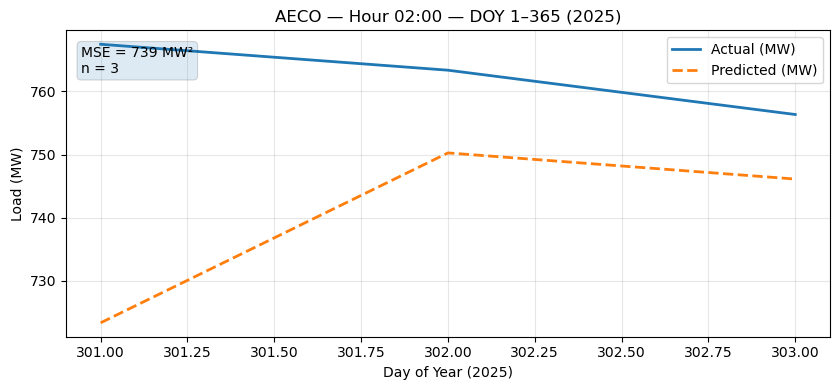

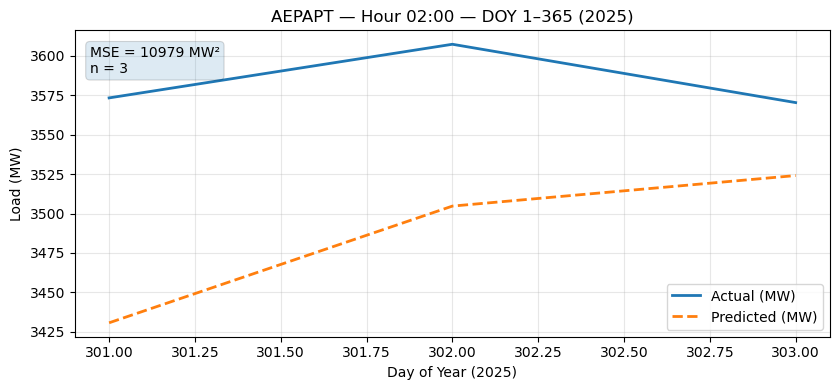

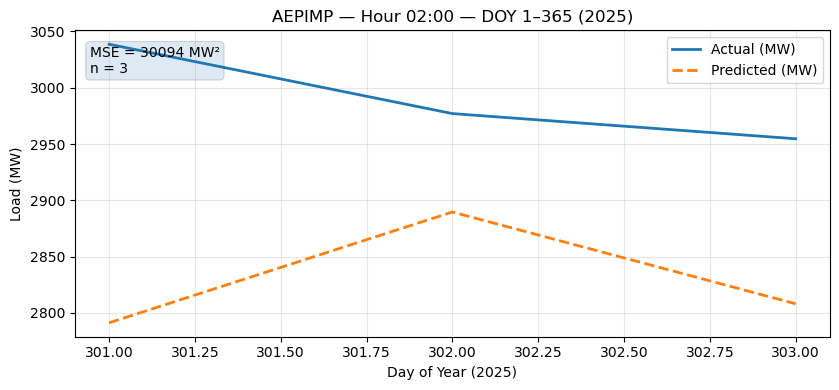

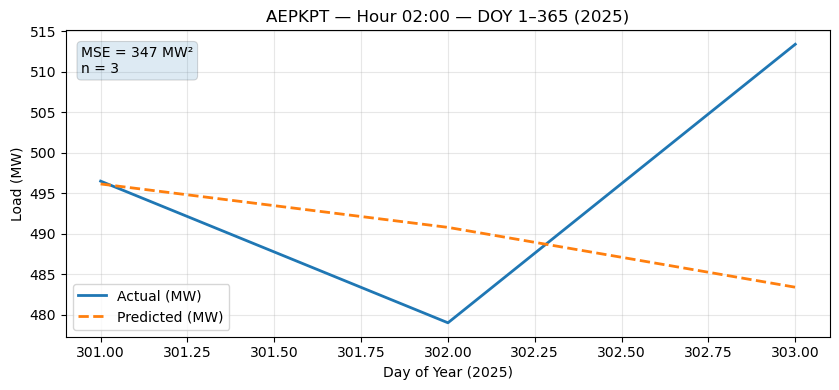

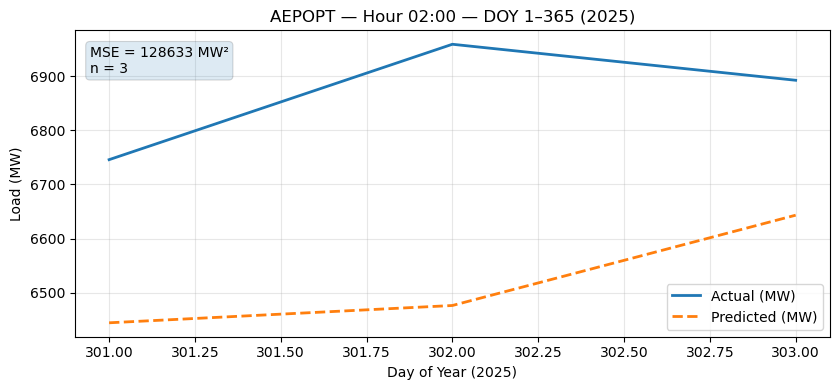

...

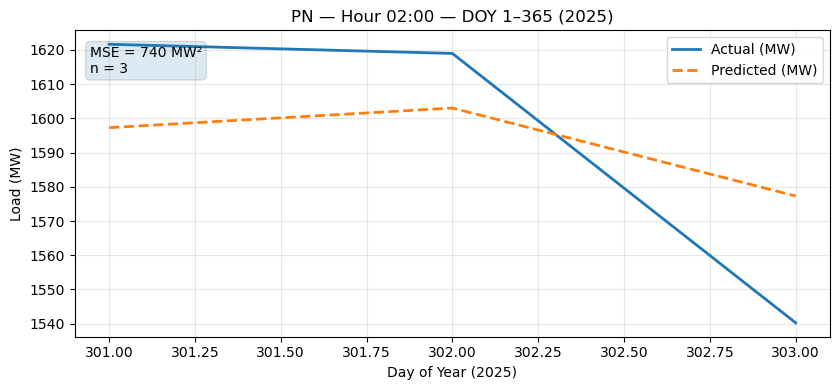

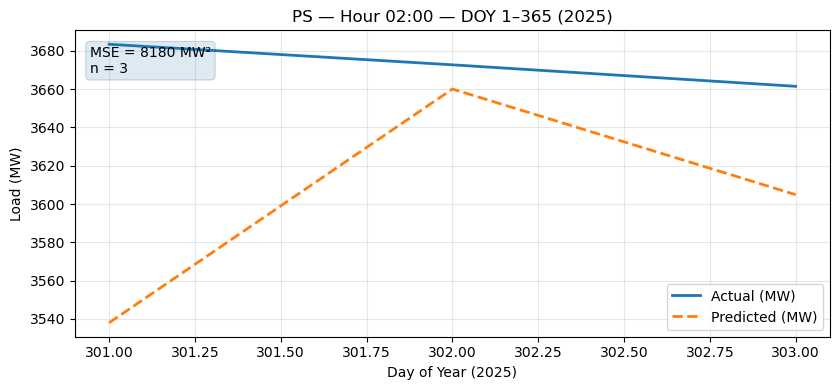

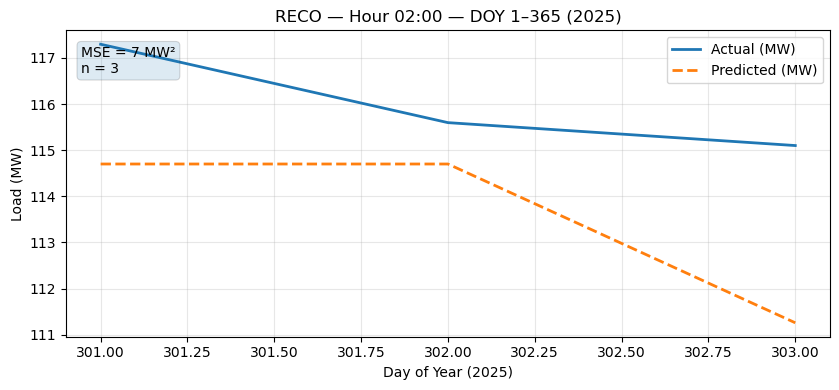

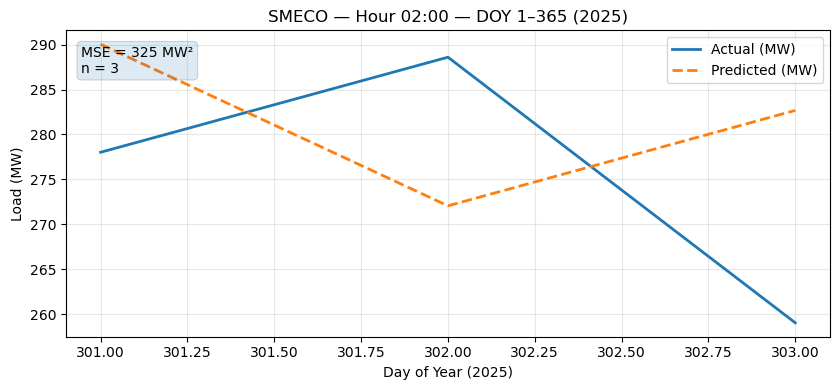

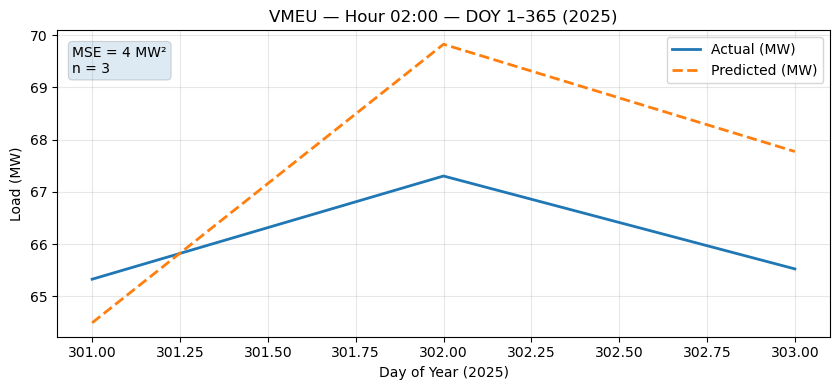

In [408]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 365
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


In [410]:
# Train on **all samples except the last 10 days** of 2025 (Oct 22–Oct 31 inclusive),
# and validate on those last 10 days.  Same boosting model/features as before.
import numpy as np
import pandas as pd
from sklearn.ensemble import HistGradientBoostingRegressor

# -------------------------
# Metrics
# -------------------------
def rmse(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred) ** 2)))

def mae(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.mean(np.abs(y_true - y_pred)))

def mape(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    mask = y_true != 0
    if mask.sum() == 0:
        return np.nan
    return float(np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100.0)

# -------------------------
# 1) Build features (lags + last-4-year same timestamp)
# -------------------------
df = merged_df.copy()
if 'load_area' in globals():
    df = df[df["load_area"].isin(load_area)].copy()

# timestamps (already EPT wall-clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)
df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear  # <- useful for your plot

# lag features per area
df["mw_lag24"]  = df.groupby("load_area", observed=True)["mw"].shift(24)
df["mw_lag48"]  = df.groupby("load_area", observed=True)["mw"].shift(48)
df["mw_lag168"] = df.groupby("load_area", observed=True)["mw"].shift(168)

# same calendar day & hour from the past 4 years (mw_ly1..mw_ly4)
def add_last_year_feats(frame: pd.DataFrame, n_years: int = 4) -> pd.DataFrame:
    out = frame
    base = (frame[["load_area", "ts", "mw"]]
            .groupby(["load_area", "ts"], as_index=False)["mw"].mean())  # collapse any DST dupes
    for k in range(1, n_years + 1):
        prev = base.rename(columns={"mw": f"mw_ly{k}"}).copy()
        prev["ts"] = prev["ts"] + pd.DateOffset(years=k)  # align prior-year value to current ts
        out = out.merge(prev, on=["load_area", "ts"], how="left")
    return out

df = add_last_year_feats(df, n_years=4)

# keep only rows where all predictors exist
feat_cols = ["mw_lag24", "mw_lag48", "mw_lag168", "mw_ly1", "mw_ly2", "mw_ly3", "mw_ly4"]
df = df.dropna(subset=feat_cols + ["mw"]).copy()

# -------------------------
# 2) Split:
#    VALID = last 10 days of 2025 (ten days before, including, Oct 31)
#            2025-10-22 00:00  →  2025-11-01 00:00 (exclusive)
#    TRAIN  = **everything else** (all other years + the rest of 2025)
# -------------------------
VAL_START = pd.Timestamp("2025-10-22 00:00:00")
VAL_END   = pd.Timestamp("2025-11-01 00:00:00")  # exclusive

is_val   = (df["ts"] >= VAL_START) & (df["ts"] < VAL_END) & (df["year"] == 2025)
train_df = df.loc[~is_val].copy()
valid_df = df.loc[ is_val].copy()

print(f"Train span: {train_df['ts'].min()} → {train_df['ts'].max()}")
print(f"Valid span: {valid_df['ts'].min()} → {valid_df['ts'].max()}")
print(f"Train rows: {len(train_df):,} | Valid rows (last 10 days): {len(valid_df):,}")

# -------------------------
# 3) Fit boosting model (NO CV)
# -------------------------
X_train = train_df[feat_cols].to_numpy()
y_train = train_df["mw"].to_numpy()

X_valid = valid_df[feat_cols].to_numpy()
y_valid = valid_df["mw"].to_numpy()

hgb = HistGradientBoostingRegressor(
    loss="squared_error",
    learning_rate=0.05,
    max_iter=2000,
    early_stopping=True,       # internal ES on a fraction of TRAIN only
    n_iter_no_change=100,
    validation_fraction=0.1,
    max_depth=None,
    max_bins=255,
    l2_regularization=1.0,
    min_samples_leaf=50,
    random_state=42
)
hgb.fit(X_train, y_train)

# -------------------------
# 4) Predict on the last 10 days (validation) and store
# -------------------------
valid_df["pred"] = hgb.predict(X_valid)

# -------------------------
# 5) Metrics on the last-10-days window
# -------------------------
print("\nValidation (last 10 days of 2025: 2025-10-22..2025-10-31):")
print(f"  RMSE: {rmse(y_valid, valid_df['pred']):,.2f} MW")
print(f"  MAE : {mae(y_valid,  valid_df['pred']):,.2f} MW")
print(f"  MAPE: {mape(y_valid, valid_df['pred']):,.2f}%")

# (Optional) Per-area diagnostics
# per_area_rmse = (
#     valid_df.groupby("load_area", observed=True)
#             .apply(lambda d: rmse(d['mw'].to_numpy(), d['pred'].to_numpy()))
#             .to_frame("RMSE_MW").sort_values("RMSE_MW")
# )
# print("\nPer-load_area RMSE (last 10 days):")
# print(per_area_rmse)

# -------------------------
# Now your plotting cell can use valid_df (it already has ts, hour, doy, pred)
# -------------------------


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2339928238.py:33: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


Train span: 2020-01-01 00:00:00 → 2025-10-21 23:00:00
Valid span: 2025-10-22 00:00:00 → 2025-10-30 23:00:00
Train rows: 1,379,229 | Valid rows (last 10 days): 6,048

Validation (last 10 days of 2025: 2025-10-22..2025-10-31):
  RMSE: 177.55 MW
  MAE : 103.90 MW
  MAPE: 4.51%


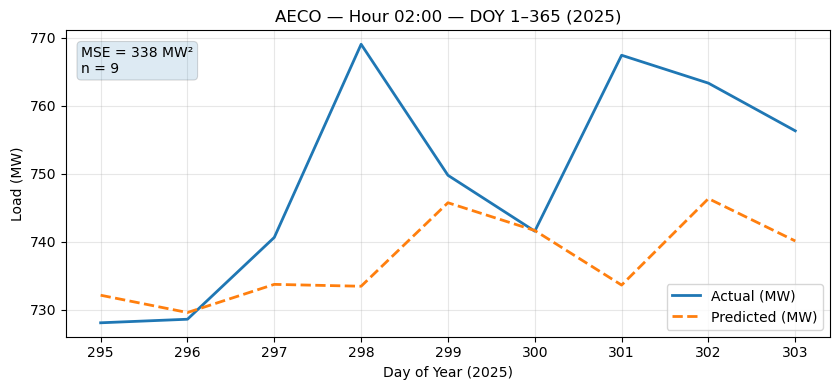

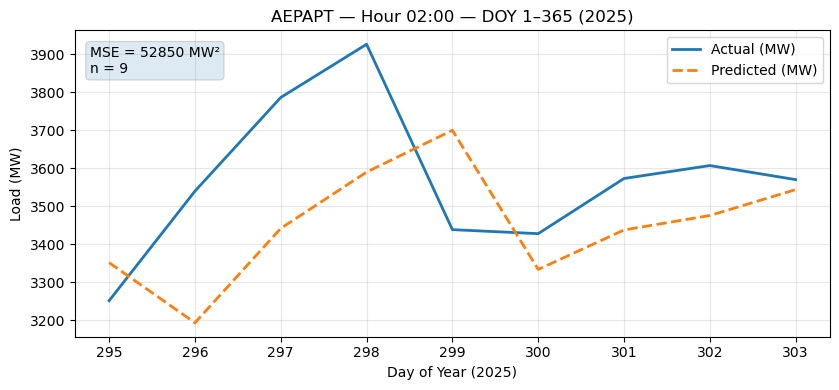

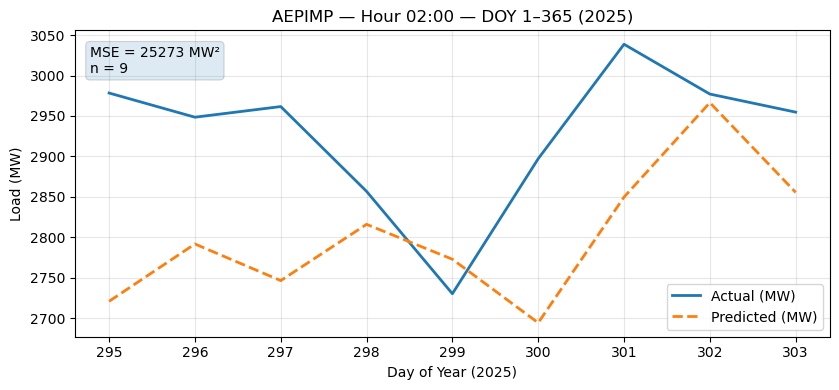

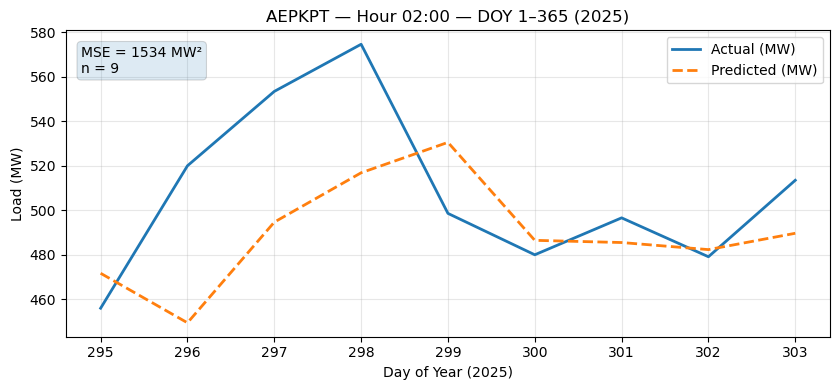

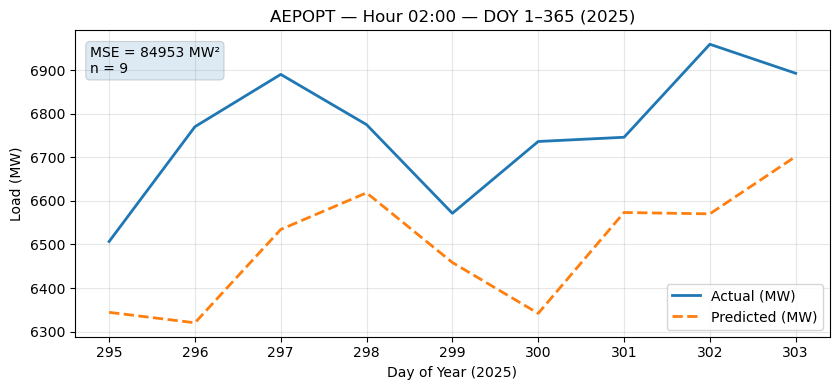

...

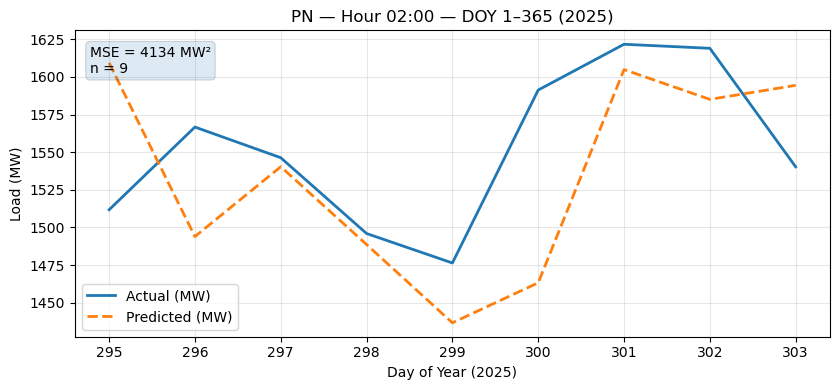

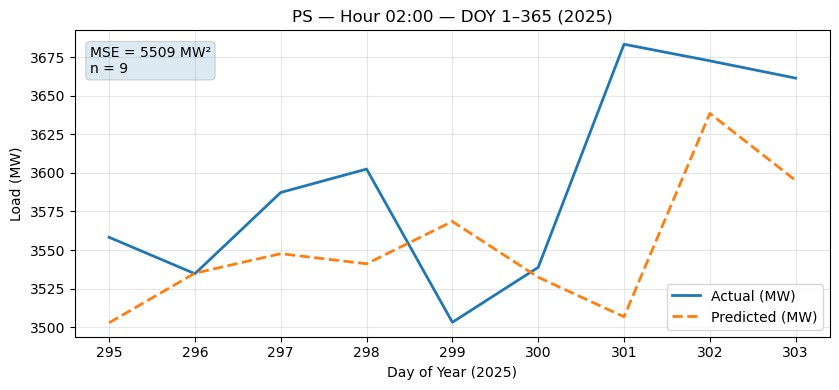

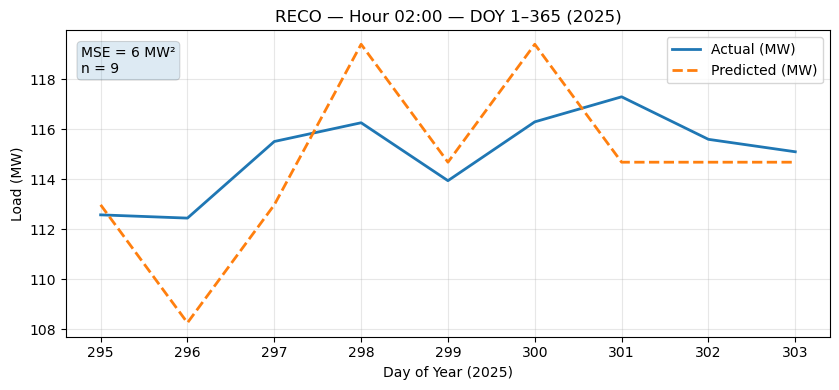

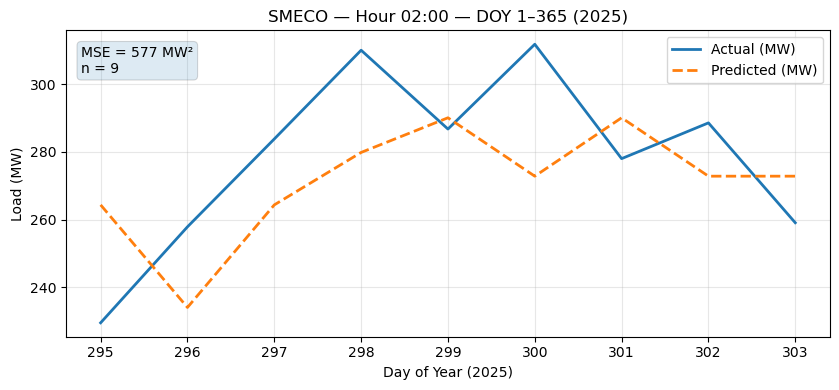

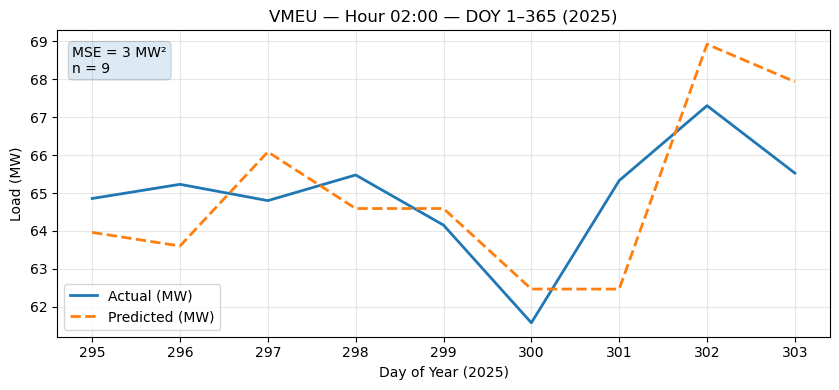

In [411]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 365
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


In [473]:
df = merged_df.copy()
if 'load_area' in globals():
    df = df[df["load_area"].isin(load_area)].copy()

# timestamps (EPT wall-clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)
df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear  

def add_last_year_feats(frame: pd.DataFrame, n_years: int = 4) -> pd.DataFrame:
    out = frame
    base = (frame[["load_area", "ts", "mw"]]
            .groupby(["load_area", "ts"], as_index=False)["mw"].mean())  # collapse any DST dupes
    for k in range(1, n_years + 1):
        prev = base.rename(columns={"mw": f"mw_ly{k}"}).copy()
        prev["ts"] = prev["ts"] + pd.DateOffset(years=k)  # align prior-year load to current timestamp
        out = out.merge(prev, on=["load_area", "ts"], how="left")
    return out

df = add_last_year_feats(df, n_years=4)


# -------------------------
# 3) Create lag features **by exact timestamp lookup** (not shift),
#    so we can sanitize training rows that would reference holdout.
# -------------------------
def add_lag_by_lookup(frame: pd.DataFrame, hours: int, out_col: str) -> pd.DataFrame:
    key = frame[["load_area", "ts", "mw"]].copy()
    key = key.rename(columns={"mw": out_col})
    key["ts"] = key["ts"] + pd.Timedelta(hours=hours)  # align t-hours -> t
    return frame.merge(key, on=["load_area", "ts"], how="left")

for h, c in [(24, "mw_lag24"), (48, "mw_lag48"), (168, "mw_lag168")]:
    df = add_lag_by_lookup(df, hours=h, out_col=c)
# Define the 10‑day holdout window
HOLD_LO = pd.Timestamp("2025-10-22 00:00:00")
HOLD_HI = pd.Timestamp("2025-11-01 00:00:00")  # exclusive

# (Do your merges / feature adds here... e.g., add lags, last-year features)

# Recompute the mask on the CURRENT df so indices align
is_holdout = (df["ts"].ge(HOLD_LO) & df["ts"].lt(HOLD_HI) & df["year"].eq(2025))

# Split (no braces, no dict keys, just a boolean Series aligned to df.index)
valid_df = df.loc[is_holdout].copy()
train_df = df.loc[~is_holdout].copy()

# -------------------------
# 4) SANITIZE TRAIN: any lag whose reference time falls inside holdout is set to NaN.
#    (Prevents leakage of validation actuals into training features.)
# -------------------------
for lag_h, lag_col in [(24, "mw_lag24"), (48, "mw_lag48"), (168, "mw_lag168")]:
    ref_ts = train_df["ts"] - pd.Timedelta(hours=lag_h)
    leak_mask = (ref_ts >= HOLD_LO) & (ref_ts < HOLD_HI)
    train_df.loc[leak_mask, lag_col] = np.nan

# We require all lag features + mw_ly1..mw_ly4 to exist for training
feat_cols = ["mw_lag24", "mw_lag48", "mw_lag168"]
train_df = train_df.dropna(subset=feat_cols + ["mw"]).copy()

print(f"Train rows after leakage sanitization: {len(train_df):,}")

# -------------------------
# 5) Fit boosting model (no CV; uses internal early stopping on TRAIN only)
# -------------------------
X_train = train_df[feat_cols].to_numpy()
y_train = train_df["mw"].to_numpy()

hgb = HistGradientBoostingRegressor(
    loss="squared_error",
    learning_rate=0.05,
    max_iter=2000,
    early_stopping=False,     # TRAIN-only internal holdout
    n_iter_no_change=200,
    validation_fraction=0.1, # fraction of TRAIN
    max_bins=255,
    min_samples_leaf=50,
    l2_regularization=1.0,
    max_depth=None,
    random_state=42
)
hgb.fit(X_train, y_train)

# -------------------------
# 6) PREDICT VALIDATION **without using validation actuals**:
#    Roll forward per (area, ts): if a required lag points inside holdout,
#    use our prior PREDICTION for that lag time (never the actual).
# -------------------------
# Known dictionary: all training actuals only
known = {(r.load_area, r.ts): r.mw for r in train_df[["load_area","ts","mw"]].itertuples(index=False)}

# Prepare container for predictions
valid_df = valid_df.sort_values(["load_area", "ts"]).copy()
valid_df["pred"] = np.nan

def row_feat_vector(row, known_map):
    area, ts = row["load_area"], row["ts"]
    l24  = known_map.get((area, ts - pd.Timedelta(hours=24)),  np.nan)
    l48  = known_map.get((area, ts - pd.Timedelta(hours=48)),  np.nan)
    l168 = known_map.get((area, ts - pd.Timedelta(hours=168)), np.nan)
    return np.array([[l24, l48, l168]])

# Roll forward within each area
for area, g in valid_df.groupby("load_area", sort=False):
    idxs = g.sort_values("ts").index
    for idx in idxs:
        feats = row_feat_vector(valid_df.loc[idx], known)
        yhat  = float(hgb.predict(feats)[0])
        valid_df.at[idx, "pred"] = yhat
        # update knowledge so downstream lags can use our prediction
        known[(area, valid_df.at[idx, "ts"])] = yhat

# -------------------------
# 7) Metrics on the 10-day validation window
# -------------------------
y_valid = valid_df["mw"].to_numpy()
y_hat   = valid_df["pred"].to_numpy()

print("\nValidation (NO validation info used in train or features): 2025-10-22..2025-10-31")
print(f"  RMSE: {rmse(y_valid, y_hat):,.2f} MW")
print(f"  MAE : {mae(y_valid,  y_hat):,.2f} MW")
print(f"  MAPE: {mape(y_valid, y_hat):,.2f}%")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3509989948.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


Train rows after leakage sanitization: 2,392,351

Validation (NO validation info used in train or features): 2025-10-22..2025-10-31
  RMSE: 233.73 MW
  MAE : 137.63 MW
  MAPE: 5.46%


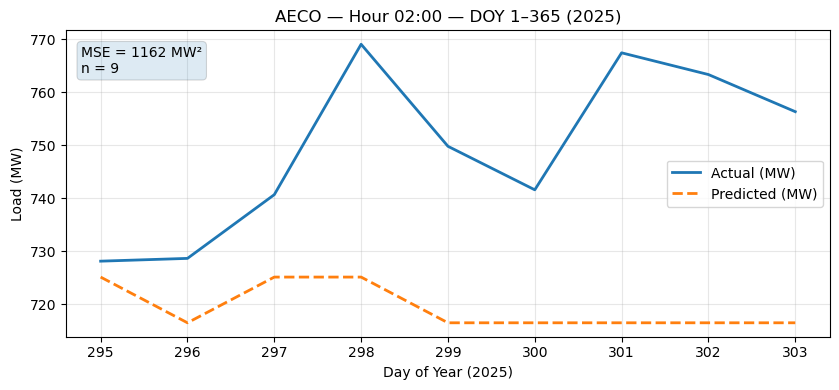

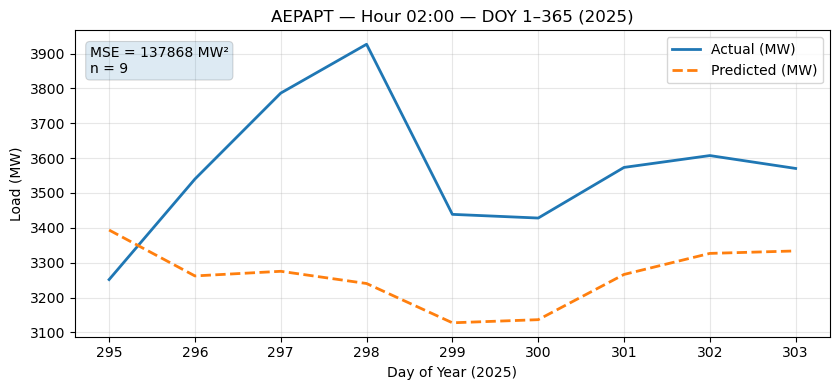

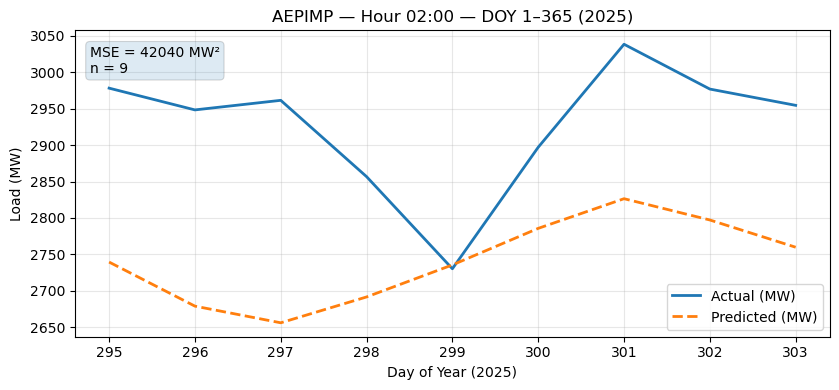

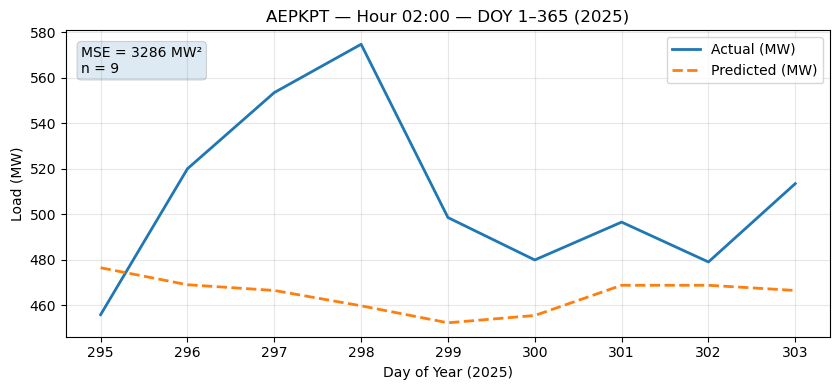

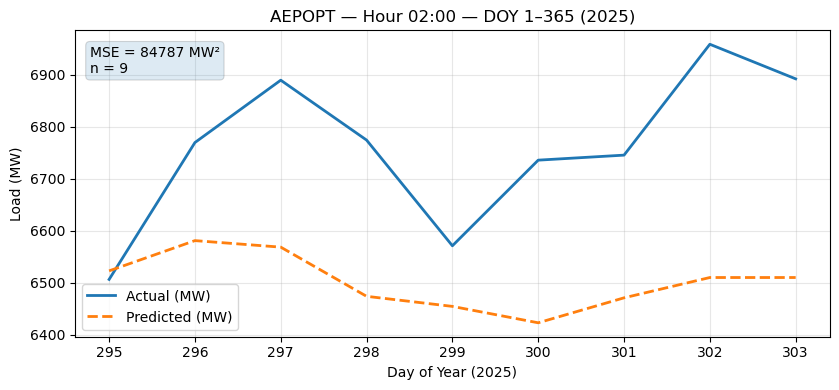

...

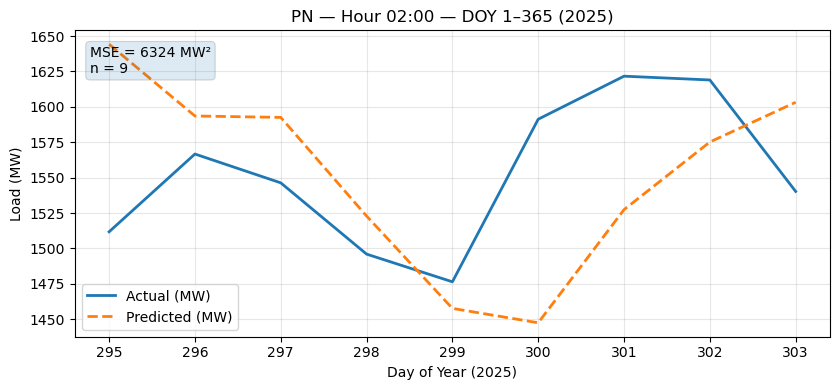

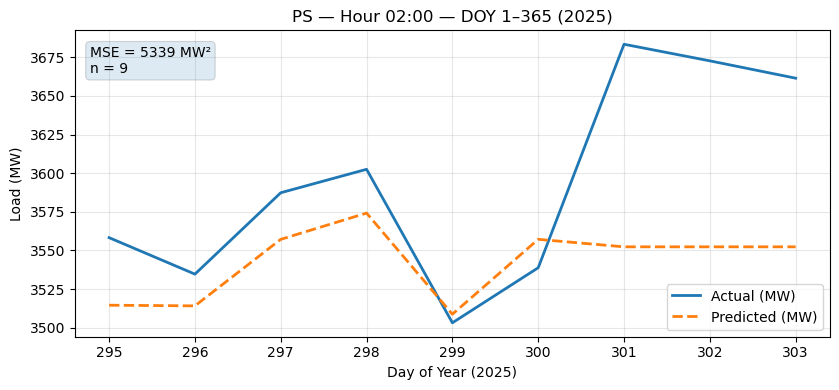

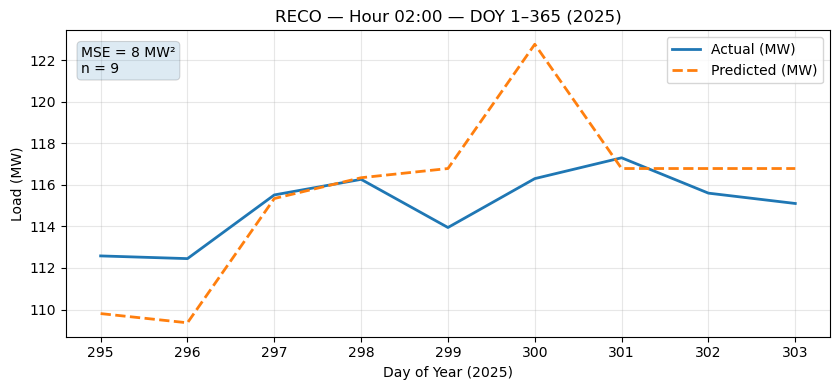

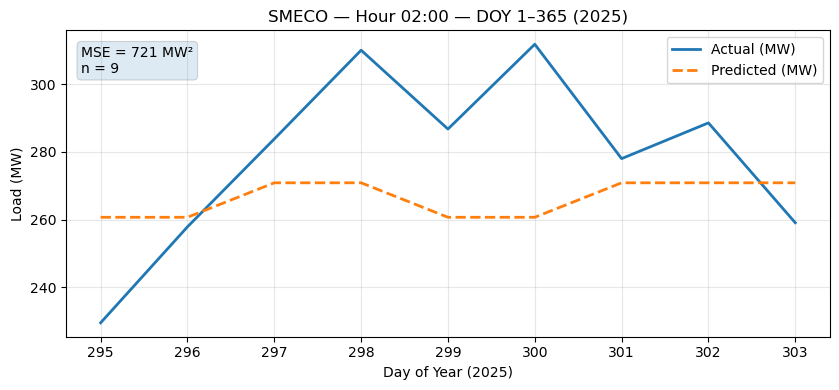

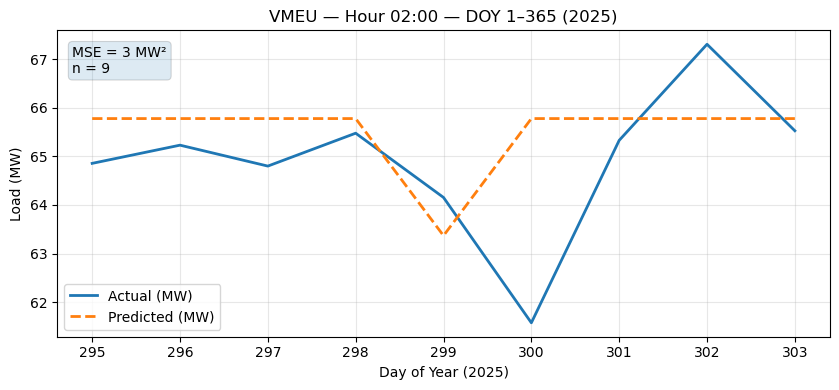

In [475]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

start_doy, end_doy = 1, 365
hour = 2

last_valid_df = valid_df[(valid_df['doy'].between(start_doy, end_doy)) &
                         (valid_df['hour'] == hour)].copy()

# if you need weekday labels later, these lines are fine to keep
year_ = int(last_valid_df['ts'].dt.year.mode().iloc[0])
xs = np.arange(start_doy, end_doy + 1)
dow_labels = [
    (pd.Timestamp(f"{year_}-01-01") + pd.to_timedelta(d - 1, unit="D")).day_name()
    for d in xs
]

def mse_series(y_true_s, y_pred_s):
    """Compute MSE on aligned Series, skipping NaN pairs."""
    mask = (~y_true_s.isna()) & (~y_pred_s.isna())
    if mask.sum() == 0:
        return np.nan, 0
    err = (y_true_s[mask] - y_pred_s[mask]) ** 2
    return float(err.mean()), int(mask.sum())

for area in load_area:
    area_df = last_valid_df[last_valid_df["load_area"] == area].sort_values("doy")
    if area_df.empty:
        continue

    y_actual = pd.Series(area_df['mw'].values, index=area_df['doy']).reindex(xs)
    y_pred   = pd.Series(area_df['pred'].values, index=area_df['doy']).reindex(xs)

    # ---- compute MSE for this area & period ----
    mse_val, n_used = mse_series(y_actual, y_pred)

    plt.figure(figsize=(8.5, 4))
    plt.plot(xs, y_actual, label="Actual (MW)",   color="C0", linewidth=2)
    plt.plot(xs, y_pred,   label="Predicted (MW)",color="C1", linestyle="--", linewidth=2)

    # Optional weekday tick labels:
    # plt.xticks(xs, dow_labels, rotation=0)

    plt.xlabel("Day of Year (2025)")
    plt.ylabel("Load (MW)")
    plt.title(f"{area} — Hour {hour:02d}:00 — DOY {start_doy}–{end_doy} (2025)")
    plt.grid(True, alpha=0.3)
    plt.legend()

    # annotate MSE in the top-left corner of the plot
    ax = plt.gca()
    ax.text(0.02, 0.95,
            f"MSE = {mse_val:.0f} MW²\nn = {n_used}",
            transform=ax.transAxes, va="top",
            bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))

    plt.tight_layout()
    plt.show()


In [471]:
valid_df

,timestamp,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified,temperature_2m,source_file,...,hour,doy,mw_ly1,mw_ly2,mw_ly3,mw_ly4,mw_lag24,mw_lag48,mw_lag168,pred
78006,2025-10-22 04:00:00,10/22/2025 12:00:00 AM,RFC,MIDATL,AE,AECO,774.941,False,15.5,hrl_load_metered_2025.csv,...,0,295,779.036,801.630,760.627,813.476,767.168,787.113,786.602,779.240568
78007,2025-10-22 05:00:00,10/22/2025 1:00:00 AM,RFC,MIDATL,AE,AECO,747.012,False,14.5,hrl_load_metered_2025.csv,...,1,295,747.314,774.668,785.793,767.562,739.671,753.586,752.566,747.506332
78008,2025-10-22 06:00:00,10/22/2025 2:00:00 AM,RFC,MIDATL,AE,AECO,728.100,False,13.8,hrl_load_metered_2025.csv,...,2,295,731.303,753.113,771.621,764.332,723.100,726.984,738.922,724.705662
78009,2025-10-22 07:00:00,10/22/2025 3:00:00 AM,RFC,MIDATL,AE,AECO,716.128,False,13.6,hrl_load_metered_2025.csv,...,3,295,725.472,742.258,766.731,752.285,722.021,713.578,729.364,717.968154
78010,2025-10-22 08:00:00,10/22/2025 4:00:00 AM,RFC,MIDATL,AE,AECO,727.662,False,13.3,hrl_load_metered_2025.csv,...,4,295,736.795,740.677,775.799,763.782,731.838,718.885,738.399,724.705662
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2403948,2025-10-30 23:00:00,10/30/2025 7:00:00 PM,RFC,MIDATL,AE,VMEU,86.535,False,16.0,hrl_load_metered_2025.csv,...,19,303,87.690,84.081,71.902,71.572,86.476,87.980,85.220,86.001562
2403949,2025-10-31 00:00:00,10/30/2025 8:00:00 PM,RFC,MIDATL,AE,VMEU,83.449,False,15.8,hrl_load_metered_2025.csv,...,20,303,83.586,79.978,70.735,70.052,83.906,85.185,82.902,81.541677
2403950,2025-10-31 01:00:00,10/30/2025 9:00:00 PM,RFC,MIDATL,AE,VMEU,79.849,False,15.1,hrl_load_metered_2025.csv,...,21,303,79.714,75.689,69.325,68.008,80.861,82.124,79.825,81.541677
2403951,2025-10-31 02:00:00,10/30/2025 10:00:00 PM,RFC,MIDATL,AE,VMEU,75.366,False,13.8,hrl_load_metered_2025.csv,...,22,303,75.295,70.639,65.944,65.402,76.416,77.262,75.422,75.982754


In [557]:
df = merged_df.copy()
if 'load_area' in globals():
    df = df[df["load_area"].isin(load_area)].copy()

# timestamps (EPT wall-clock)
df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)
df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["doy"]  = df["ts"].dt.dayofyear  

def add_last_year_feats(frame: pd.DataFrame, n_years: int = 4) -> pd.DataFrame:
    out = frame
    base = (frame[["load_area", "ts", "mw"]]
            .groupby(["load_area", "ts"], as_index=False)["mw"].mean())  # collapse any DST dupes
    for k in range(1, n_years + 1):
        prev = base.rename(columns={"mw": f"mw_ly{k}"}).copy()
        prev["ts"] = prev["ts"] + pd.DateOffset(years=k)  # align prior-year load to current timestamp
        out = out.merge(prev, on=["load_area", "ts"], how="left")
    return out

df = add_last_year_feats(df, n_years=4)


# -------------------------
# 3) Create lag features **by exact timestamp lookup** (not shift),
#    so we can sanitize training rows that would reference holdout.
# -------------------------
def add_lag_by_lookup(frame: pd.DataFrame, hours: int, out_col: str) -> pd.DataFrame:
    key = frame[["load_area", "ts", "mw"]].copy()
    key = key.rename(columns={"mw": out_col})
    key["ts"] = key["ts"] + pd.Timedelta(hours=hours)  # align t-hours -> t
    return frame.merge(key, on=["load_area", "ts"], how="left")

for h, c in [(24, "mw_lag24"), (48, "mw_lag48"), (168, "mw_lag168")]:
    df = add_lag_by_lookup(df, hours=h, out_col=c)
# Define the 10‑day holdout window
HOLD_LO = pd.Timestamp("2025-10-22 00:00:00")
HOLD_HI = pd.Timestamp("2025-11-01 00:00:00")  # exclusive

# (Do your merges / feature adds here... e.g., add lags, last-year features)

# Recompute the mask on the CURRENT df so indices align
is_holdout = (df["ts"].ge(HOLD_LO) & df["ts"].lt(HOLD_HI) & df["year"].eq(2025))

# Split (no braces, no dict keys, just a boolean Series aligned to df.index)
valid_df = df.loc[is_holdout].copy()
train_df = df.loc[~is_holdout].copy()

# -------------------------
# 4) SANITIZE TRAIN: any lag whose reference time falls inside holdout is set to NaN.
#    (Prevents leakage of validation actuals into training features.)
# -------------------------
for lag_h, lag_col in [(24, "mw_lag24"), (48, "mw_lag48"), (168, "mw_lag168")]:
    ref_ts = train_df["ts"] - pd.Timedelta(hours=lag_h)
    leak_mask = (ref_ts >= HOLD_LO) & (ref_ts < HOLD_HI)
    train_df.loc[leak_mask, lag_col] = np.nan

# We require all lag features + mw_ly1..mw_ly4 to exist for training
feat_cols = ["mw_lag24", "mw_lag48", "mw_lag168"]
train_df = train_df.dropna(subset=feat_cols + ["mw"]).copy()

print(f"Train rows after leakage sanitization: {len(train_df):,}")

# -------------------------
# 5) Fit boosting model (no CV; uses internal early stopping on TRAIN only)
# -------------------------
X_train = train_df[feat_cols].to_numpy()
y_train = train_df["mw"].to_numpy()

hgb = HistGradientBoostingRegressor(
    loss="squared_error",
    learning_rate=0.05,
    max_iter=2000,
    early_stopping=False,     # TRAIN-only internal holdout
    n_iter_no_change=200,
    validation_fraction=0.1, # fraction of TRAIN
    max_bins=255,
    min_samples_leaf=50,
    l2_regularization=1.0,
    max_depth=None,
    random_state=42
)
hgb.fit(X_train, y_train)

# -------------------------
# 6) PREDICT VALIDATION **without using validation actuals**:
#    Roll forward per (area, ts): if a required lag points inside holdout,
#    use our prior PREDICTION for that lag time (never the actual).
# -------------------------
# Known dictionary: all training actuals only
known = {(r.load_area, r.ts): r.mw for r in train_df[["load_area","ts","mw"]].itertuples(index=False)}

# Prepare container for predictions
valid_df = valid_df.sort_values(["load_area", "ts"]).copy()
valid_df["pred"] = np.nan

def row_feat_vector(row, known_map):
    area, ts = row["load_area"], row["ts"]
    l24  = known_map.get((area, ts - pd.Timedelta(hours=24)),  np.nan)
    l48  = known_map.get((area, ts - pd.Timedelta(hours=48)),  np.nan)
    l168 = known_map.get((area, ts - pd.Timedelta(hours=168)), np.nan)
    return np.array([[l24, l48, l168]])

# Roll forward within each area
for area, g in valid_df.groupby("load_area", sort=False):
    idxs = g.sort_values("ts").index
    for idx in idxs:
        feats = row_feat_vector(valid_df.loc[idx], known)
        yhat  = float(hgb.predict(feats)[0])
        valid_df.at[idx, "pred"] = yhat
        # update knowledge so downstream lags can use our prediction
        known[(area, valid_df.at[idx, "ts"])] = yhat

# -------------------------
# 7) Metrics on the 10-day validation window
# -------------------------
y_valid = valid_df["mw"].to_numpy()
y_hat   = valid_df["pred"].to_numpy()

print("\nValidation (NO validation info used in train or features): 2025-10-22..2025-10-31")
print(f"  RMSE: {rmse(y_valid, y_hat):,.2f} MW")
print(f"  MAE : {mae(y_valid,  y_hat):,.2f} MW")
print(f"  MAPE: {mape(y_valid, y_hat):,.2f}%")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3509989948.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"] = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


Train rows after leakage sanitization: 2,392,351

Validation (NO validation info used in train or features): 2025-10-22..2025-10-31
  RMSE: 233.73 MW
  MAE : 137.63 MW
  MAPE: 5.46%


## Task 2

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/190467719.py:27: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["ts"]   = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")


Fitting HGBR on 1,179,696 rows (years >= 2021), features=['mw_lag24', 'mw_lag48', 'mw_lag168']
Binning 0.025 GB of training data: 0.068 s
Binning 0.003 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4889279.21646, val loss: 4854243.52521, in 0.023s
[2/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4421974.27704, val loss: 4390125.52671, in 0.016s
[3/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4000083.52924, val loss: 3971083.29254, in 0.022s
[4/2000] 1 tree, 31 leaves, max depth = 5, train loss: 3619297.05599, val loss: 3592996.30172, in 0.024s
[5/2000] 1 tree, 31 leaves, max depth = 5, train loss: 3275497.84329, val loss: 3251590.90151, in 0.018s
[6/2000] 1 tree, 31 leaves, max depth = 5, train loss: 2965189.87387, val loss: 2943449.26531, in 0.019s
[7/2000] 1 tree, 31 leaves, max depth = 6, train loss: 2685042.22829, val loss: 2665206.28040, in 0.014s
[8/2000] 1 tree, 31 leaves, max depth = 5, train 

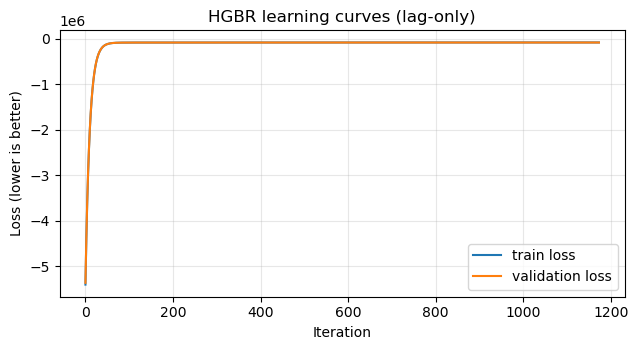


[HGB] Holdout (last 10 days of 2025) RMSE: 232.9 MW

Peak-hour ±1 accuracy (holdout):
  Argmax : 55.56%
  Soft   : 56.75%
  Prob   : 53.57%


In [543]:
# ============================================================
# LAG-ONLY (24/48/168) pipeline with progress and zero-leakage holdout
#   • Train on years >= 2021
#   • HistGradientBoostingRegressor(verbose=1) prints progress
#   • Roll-forward predictions on 2025-10-22..2025-10-31 (no leakage)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import HistGradientBoostingRegressor

# -------------------------
# Holdout window (last 10 days of 2025, incl. Oct 31)
# -------------------------
HOLD_LO = pd.Timestamp("2025-10-22 00:00:00")
HOLD_HI = pd.Timestamp("2025-11-01 00:00:00")  # exclusive

# -------------------------
# 0) Base frame (optionally restrict to your areas)
# -------------------------
df = merged_df.copy()
if 'load_area' in globals():
    df = df[df["load_area"].isin(load_area)].copy()

# Timestamps (EPT wall-clock)
df["ts"]   = pd.to_datetime(df["datetime_beginning_ept"], errors="coerce")
df         = df.dropna(subset=["ts"]).sort_values(["load_area", "ts"]).reset_index(drop=True)
df["year"] = df["ts"].dt.year
df["hour"] = df["ts"].dt.hour
df["date"] = df["ts"].dt.date

# -------------------------
# 1) Lag features by exact timestamp lookup (NOT .shift)
# -------------------------
def add_lag_by_lookup(frame: pd.DataFrame, hours: int, out_col: str) -> pd.DataFrame:
    key = frame[["load_area","ts","mw"]].rename(columns={"mw": out_col}).copy()
    key["ts"] = key["ts"] + pd.Timedelta(hours=hours)   # align t-hours → t
    return frame.merge(key, on=["load_area","ts"], how="left")

for h, c in [(24,"mw_lag24"), (48,"mw_lag48"), (168,"mw_lag168")]:
    df = add_lag_by_lookup(df, hours=h, out_col=c)

# -------------------------
# 2) Split AFTER merges; TRAIN only years >= 2021
# -------------------------
is_holdout = df["ts"].between(HOLD_LO, HOLD_HI, inclusive="left") & (df["year"] == 2025)
valid_df   = df.loc[ is_holdout].copy()
train_df   = df.loc[~is_holdout].copy()
train_df   = train_df[train_df["year"] >= 2021].copy()      # <<< after 2020 only

# -------------------------
# 3) Sanitize TRAIN lags that point into holdout (prevent leakage)
# -------------------------
for lag_h, lag_col in [(24,"mw_lag24"), (48,"mw_lag48"), (168,"mw_lag168")]:
    ref_ts   = train_df["ts"] - pd.Timedelta(hours=lag_h)
    leak_msk = ref_ts.between(HOLD_LO, HOLD_HI, inclusive="left") & (train_df["year"] == 2025)
    train_df.loc[leak_msk, lag_col] = np.nan

# -------------------------
# 4) Fit HGBR on LAG-ONLY features, with progress printing
# -------------------------
FEAT_COLS = ["mw_lag24","mw_lag48","mw_lag168"]
train_clean = train_df.dropna(subset=FEAT_COLS + ["mw"]).copy()
X_tr = train_clean[FEAT_COLS].to_numpy()
y_tr = train_clean["mw"].to_numpy()

# Optional "watch" slice to print an extra RMSE (last 30d pre-holdout)
watch_mask = (df["ts"] >= (HOLD_LO - pd.Timedelta(days=30))) & (df["ts"] < HOLD_LO)
watch_df   = df.loc[watch_mask].dropna(subset=FEAT_COLS + ["mw"]).copy()
X_watch    = watch_df[FEAT_COLS].to_numpy()
y_watch    = watch_df["mw"].to_numpy()

def rmse(a, b):
    a, b = np.asarray(a), np.asarray(b)
    return float(np.sqrt(np.mean((a - b)**2)))

hgb = HistGradientBoostingRegressor(
    loss="squared_error",
    learning_rate=0.05,
    max_iter=2000,
    early_stopping=True,       # internal 10% of TRAIN as validation
    validation_fraction=0.10,
    n_iter_no_change=100,
    max_bins=255,
    min_samples_leaf=50,
    l2_regularization=1.0,
    random_state=42,
    verbose=1                  # <<< prints progress lines during fit
    # NOTE: DO NOT pass scoring='squared_error' (invalid). Use default loss-based scoring.
)
print(f"Fitting HGBR on {len(train_clean):,} rows (years >= 2021), features={FEAT_COLS}")
hgb.fit(X_tr, y_tr)

print("\n[Training summary]")
print("  n_iter_             :", getattr(hgb, "n_iter_", None))
print("  Train RMSE (fit)    :", f"{rmse(y_tr, hgb.predict(X_tr)):.1f} MW")
if len(y_watch) > 0:
    print("  Watch RMSE (pre-HOLD):", f"{rmse(y_watch, hgb.predict(X_watch)):.1f} MW")

# Learning curves (if available)
tr_curve = np.asarray(getattr(hgb, "train_score_", []), float)
va_curve = np.asarray(getattr(hgb, "validation_score_", []), float)
if tr_curve.size and va_curve.size:
    best_iter = int(np.nanargmin(va_curve)) + 1
    print(f"  Best validation loss at iter {best_iter}: {va_curve[best_iter-1]:.6g}")
    plt.figure(figsize=(6.5, 3.6))
    plt.plot(tr_curve, label="train loss")
    plt.plot(va_curve, label="validation loss")
    plt.xlabel("Iteration"); plt.ylabel("Loss (lower is better)")
    plt.title("HGBR learning curves (lag-only)")
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

# -------------------------
# 5) TRAIN residuals → robust sigma(area,hour) for uncertainty (optional)
# -------------------------
train_clean = train_clean.copy()
train_clean["pred_tr"] = hgb.predict(X_tr)
train_clean["resid"]   = train_clean["mw"] - train_clean["pred_tr"]

def robust_sigma(s: pd.Series) -> float:
    med = np.median(s)
    mad = np.median(np.abs(s - med))
    if np.isnan(mad) or mad == 0:
        std = np.std(s)
        return float(std if std > 1e-6 else 1.0)
    return float(1.4826 * mad)

sigma_map = (train_clean.groupby(["load_area","hour"], observed=True)["resid"].apply(robust_sigma))
sigma_hour_global = (train_clean.groupby("hour", observed=True)["resid"].apply(robust_sigma))

def get_sigma_vec(area, hours):
    out = []
    for h in hours:
        key = (area, int(h))
        if key in sigma_map.index:
            out.append(float(sigma_map.loc[key]))
        else:
            out.append(float(sigma_hour_global.loc[int(h)]))
    return np.array(out, dtype=float)

# -------------------------
# 6) Zero‑leakage roll-forward predictions on holdout (lag-only)
#     For lags inside holdout, use our own prior predictions.
# -------------------------
# Seed with TRAIN actuals (>= 2021; holdout excluded)
known = {(r.load_area, r.ts): r.mw for r in train_df[["load_area","ts","mw"]].itertuples(index=False)}

valid_df = valid_df.sort_values(["load_area","ts"]).copy()
valid_df["pred"] = np.nan

def feat_row(row, known_map):
    a, t = row["load_area"], row["ts"]
    return np.array([[
        known_map.get((a, t - pd.Timedelta(hours=24)),  np.nan),
        known_map.get((a, t - pd.Timedelta(hours=48)),  np.nan),
        known_map.get((a, t - pd.Timedelta(hours=168)), np.nan),
    ]])

for area, g in valid_df.groupby("load_area", sort=False):
    for idx in g.index:
        X_one = feat_row(valid_df.loc[idx], known)
        yhat  = float(hgb.predict(X_one)[0])            # <-- 3 lag features only
        valid_df.at[idx, "pred"] = yhat
        known[(area, valid_df.at[idx, "ts"])] = yhat    # enable recursive lags inside holdout

# -------------------------
# 7) Holdout RMSE (hourly forecasting objective)
# -------------------------
def rmse_series(y_true, y_pred):
    y_true, y_pred = np.asarray(y_true), np.asarray(y_pred)
    return float(np.sqrt(np.mean((y_true - y_pred)**2)))

print(f"\n[HGB] Holdout (last 10 days of 2025) RMSE: {rmse_series(valid_df['mw'], valid_df['pred']):.1f} MW")

# -------------------------
# (Optional) Peak-hour evaluation with ±1-hour success rule
# -------------------------
def acc_pm1(pred, truth):
    pred  = np.asarray(pred, dtype=int)
    truth = np.asarray(truth, dtype=int)
    return float(np.mean(np.abs(pred - truth) <= 1))

# keep complete 24h days
counts_v = valid_df.groupby(["load_area","date"])["hour"].nunique()
keep_v   = counts_v[counts_v == 24].index
valid_24 = (valid_df.set_index(["load_area","date"]).loc[keep_v].reset_index()
                    .sort_values(["load_area","date","hour"]))

# selectors that use only the forecast mean and (optionally) sigma
def soft_argmax(mu, kernel=(1,3,1)):
    k  = np.array(kernel, dtype=float); sm = np.convolve(mu, k, mode="same")
    return int(np.argmax(sm))

def probabilistic_peak(mu, sigma, n_draws=1000, rng=None):
    if rng is None: rng = np.random.default_rng(42)
    Z = rng.standard_normal((n_draws, len(mu)))
    Y = mu[None, :] + sigma[None, :] * Z
    hmax = np.argmax(Y, axis=1)
    votes = np.zeros(len(mu), dtype=int)
    for h in hmax:
        votes[h] += 1
        if h-1 >= 0: votes[h-1] += 1
        if h+1 < len(mu): votes[h+1] += 1
    return int(np.argmax(votes))

rows = []
for (area, day), g in valid_24.groupby(["load_area","date"], sort=True):
    mu  = g["pred"].to_numpy()
    y   = g["mw"].to_numpy()
    sig = get_sigma_vec(area, g["hour"].to_numpy())
    rows.append({
        "load_area": area,
        "date": pd.to_datetime(day),
        "peak_true":  int(np.argmax(y)),
        "peak_argmax": int(np.argmax(mu)),
        "peak_soft":   soft_argmax(mu, kernel=(1,3,1)),
        "peak_prob":   probabilistic_peak(mu, sig, n_draws=1000),
    })

if rows:
    ph_df = pd.DataFrame(rows).sort_values(["load_area","date"]).reset_index(drop=True)
    print("\nPeak-hour ±1 accuracy (holdout):")
    print(f"  Argmax : {acc_pm1(ph_df['peak_argmax'], ph_df['peak_true']):.2%}")
    print(f"  Soft   : {acc_pm1(ph_df['peak_soft'],   ph_df['peak_true']):.2%}")
    print(f"  Prob   : {acc_pm1(ph_df['peak_prob'],   ph_df['peak_true']):.2%}")


In [535]:
train_df

,timestamp,datetime_beginning_ept,nerc_region,mkt_region,zone,load_area,mw,is_verified,temperature_2m,source_file,...,year,hour,doy,mw_ly1,mw_ly2,mw_ly3,mw_ly4,mw_lag24,mw_lag48,mw_lag168


In [523]:

# ------------------------------------------------------------
# Helpers
# ------------------------------------------------------------
def _ensure_complete_days(df_area):
    """Keep only days with 24 hours present."""
    df = df_area.copy()
    df["date"] = df["ts"].dt.normalize()
    counts = df.groupby("date")["hour"].nunique()
    keep = counts[counts == 24].index
    return df[df["date"].isin(keep)].copy()

def _dow_str(d):
    return pd.to_datetime(d).day_name()[:3]

# ------------------------------------------------------------
# 1) Small multiples: 10 panels (one per day), 24h actual vs. forecast
# ------------------------------------------------------------
def plot_area_day_panels(valid_df, area):
    g = valid_df[valid_df["load_area"] == area].copy()
    if g.empty:
        print(f"No validation rows for area {area}.")
        return
    g = _ensure_complete_days(g).sort_values(["date","hour"])
    days = g["date"].drop_duplicates().tolist()
    if not days:
        print(f"No complete days (24h) for area {area}.")
        return

    n = len(days)
    ncols = 5
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.6*ncols, 2.8*nrows), sharex=True, sharey=False)
    axes = np.array(axes).reshape(nrows, ncols)

    for i, day in enumerate(days):
        ax = axes.flat[i]
        d = g[g["date"] == day]
        ax.plot(d["hour"], d["mw"],  label="Actual",    linewidth=2)
        ax.plot(d["hour"], d["pred"], label="Forecast",  linewidth=2, linestyle="--")
        ax.set_title(f"{_dow_str(day)} {pd.to_datetime(day).strftime('%m/%d')}", fontsize=10)
        ax.grid(True, alpha=0.3)
        if i % ncols == 0:
            ax.set_ylabel("MW")
        if i // ncols == nrows-1:
            ax.set_xlabel("Hour")
        # MSE in corner
        mse = float(np.mean((d["mw"].to_numpy() - d["pred"].to_numpy())**2))
        ax.text(0.02, 0.95, f"MSE={mse:,.0f}", transform=ax.transAxes, va="top",
                bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))
    # hide any empty axes
    for j in range(n, nrows*ncols):
        axes.flat[j].axis("off")

    handles, labels = axes.flat[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper center", ncol=2)
    fig.suptitle(f"{area} — Validation (Last 10 Days) — 24‑Hour Profiles", y=1.02, fontsize=13)
    fig.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 2) Heatmap: day × hour of errors for one area
#    kind="error" shows signed error (pred-actual); kind="abs" shows |error|
# ------------------------------------------------------------
def plot_area_heatmap(valid_df, area, kind="error"):
    g = valid_df[valid_df["load_area"] == area].copy()
    if g.empty:
        print(f"No validation rows for area {area}.")
        return
    g = _ensure_complete_days(g).sort_values(["date","hour"])
    g["date_str"] = g["ts"].dt.strftime("%m/%d") + " " + g["ts"].dt.day_name().str[:3]
    if kind == "abs":
        g["val"] = (g["pred"] - g["mw"]).abs()
        cmap = "viridis"; title = "Absolute Error |pred−actual| (MW)"
    else:
        g["val"] = (g["pred"] - g["mw"])
        cmap = "coolwarm"; title = "Signed Error pred−actual (MW)"

    M = g.pivot_table(index="date_str", columns="hour", values="val", aggfunc="first")
    M = M.reindex(columns=np.arange(24))  # ensure 0..23 hours

    plt.figure(figsize=(12, max(2, 0.4*len(M))))
    im = plt.imshow(M.values, aspect="auto", cmap=cmap, interpolation="nearest")
    plt.colorbar(im, label=title)
    plt.yticks(np.arange(len(M)), M.index)
    plt.xticks(np.arange(24), np.arange(24))
    plt.xlabel("Hour")
    plt.ylabel("Day")
    plt.title(f"{area} — Validation (Last 10 Days) — {title}")
    plt.tight_layout()
    plt.show()

# ------------------------------------------------------------
# 3) One-hour strip across the 10 days with labels and MSE
# ------------------------------------------------------------
def plot_area_hour_strip(valid_df, area, hour=18):
    g = valid_df[(valid_df["load_area"] == area) & (valid_df["hour"] == hour)].copy()
    if g.empty:
        print(f"No validation rows for area {area} at hour={hour}.")
        return
    g = g.sort_values("ts")
    x = np.arange(len(g))
    plt.figure(figsize=(10, 3.5))
    plt.plot(x, g["mw"].to_numpy(),   label="Actual",   linewidth=2)
    plt.plot(x, g["pred"].to_numpy(), label="Forecast", linewidth=2, linestyle="--")
    labels = [f"{d.strftime('%m/%d')} {d.day_name()[:3]}" for d in g["ts"].dt.to_pydatetime()]
    plt.xticks(x, labels, rotation=45, ha="right")
    plt.ylabel("MW"); plt.xlabel("Validation Days")
    plt.title(f"{area} — Hour {hour:02d}:00 — Actual vs Forecast (Last 10 Days)")
    plt.grid(True, alpha=0.3); plt.legend()
    mse = float(np.mean((g["mw"].to_numpy() - g["pred"].to_numpy())**2))
    plt.text(0.01, 0.95, f"MSE={mse:,.0f}", transform=plt.gca().transAxes, va="top",
             bbox=dict(boxstyle="round", alpha=0.15, linewidth=0.8))
    plt.tight_layout(); plt.show()


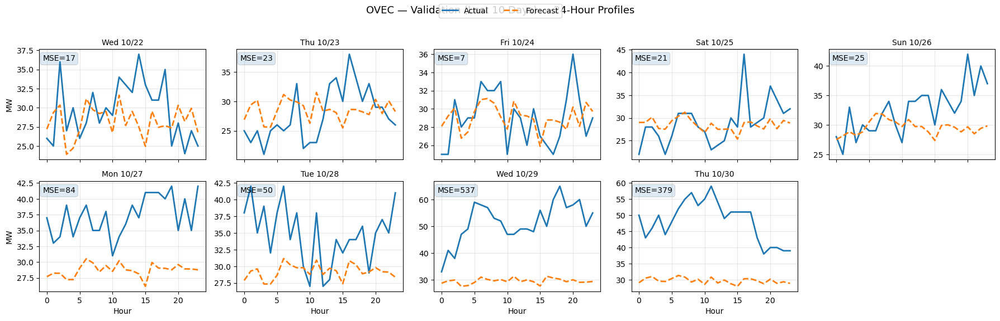

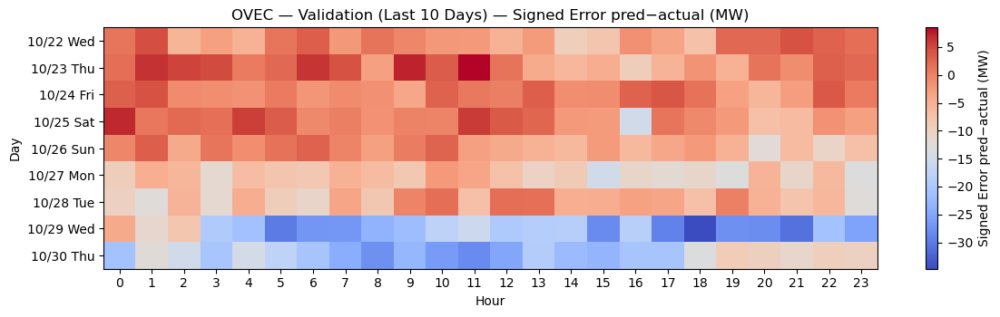

/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/2441250165.py:109: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  labels = [f"{d.strftime('%m/%d')} {d.day_name()[:3]}" for d in g["ts"].dt.to_pydatetime()]


AttributeError: 'datetime.datetime' object has no attribute 'day_name'

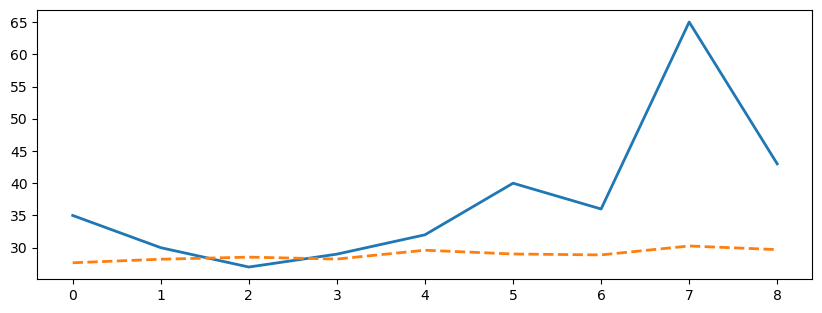

In [507]:

area = "OVEC"
plot_area_day_panels(valid_df, area)              # 10 small multiples: 24h actual vs. forecast
plot_area_heatmap(valid_df, area, kind="error")   # day × hour heatmap of signed error (pred - actual)
plot_area_hour_strip(valid_df, area, hour=18)     # one-hour strip across the 10 days with MSE/labels


In [545]:
import numpy as np
import pandas as pd
from sklearn.ensemble import HistGradientBoostingRegressor, HistGradientBoostingClassifier

# ============================================================
# CONFIG — holdout = 2025‑10‑22 .. 2025‑10‑31 (exclusive end 2025‑11‑01 00:00)
# ============================================================
HOLD_LO = pd.Timestamp("2025-10-22 00:00:00")
HOLD_HI = pd.Timestamp("2025-11-01 00:00:00")  # exclusive
TRAIN_START = pd.Timestamp("2021-01-01")       # train only on data after 2020

# ============================================================
# 0) BASE DATAFRAME — lag-only features by timestamp lookup
# ============================================================
df = merged_df.copy()
if 'load_area' in globals():
    df = df[df['load_area'].isin(load_area)].copy()

df['ts']   = pd.to_datetime(df['datetime_beginning_ept'], errors='coerce')
df         = df.dropna(subset=['ts']).sort_values(['load_area','ts']).reset_index(drop=True)
df['year'] = df['ts'].dt.year
df['hour'] = df['ts'].dt.hour
df['date'] = df['ts'].dt.normalize()

assert 'temperature_2m' in df.columns, "temperature_2m missing — merge weather first."

def add_lag_by_lookup(frame: pd.DataFrame, hours: int, out_col: str) -> pd.DataFrame:
    key = frame[['load_area','ts','mw']].rename(columns={'mw': out_col}).copy()
    key['ts'] = key['ts'] + pd.Timedelta(hours=hours)  # align t-hours → t
    return frame.merge(key, on=['load_area','ts'], how='left')

for h, col in [(24,'mw_lag24'), (48,'mw_lag48'), (168,'mw_lag168')]:
    df = add_lag_by_lookup(df, h, col)

FEAT_LAGS = ['mw_lag24','mw_lag48','mw_lag168']

# ============================================================
# 1) SPLIT — TRAIN (>=2021, NOT in holdout) vs VALID (the 10-day window)
# ============================================================
is_holdout = df['ts'].between(HOLD_LO, HOLD_HI, inclusive='left') & (df['year'] == 2025)
train_df   = df.loc[(~is_holdout) & (df['ts'] >= TRAIN_START)].copy()
valid_df   = df.loc[ is_holdout].copy()

# Sanitize TRAIN: if a lag’s reference time falls inside holdout → NaN (prevent leakage)
for lag_h, lag_col in [(24,'mw_lag24'), (48,'mw_lag48'), (168,'mw_lag168')]:
    ref_ts   = train_df['ts'] - pd.Timedelta(hours=lag_h)
    leak_msk = ref_ts.between(HOLD_LO, HOLD_HI, inclusive='left') & (train_df['year'] == 2025)
    train_df.loc[leak_msk, lag_col] = np.nan

# Keep rows with all 3 lags
train_df = train_df.dropna(subset=FEAT_LAGS + ['mw','temperature_2m']).copy()

# ============================================================
# 2) HOURLY FORECASTER (lag-only HGBR) — used to create features for Tasks 2 & 3
# ============================================================
def rmse(a, b):
    a, b = np.asarray(a), np.asarray(b)
    return float(np.sqrt(np.mean((a - b) ** 2)))

X_tr_reg = train_df[FEAT_LAGS].to_numpy()
y_tr_reg = train_df['mw'].to_numpy()

hgb_reg = HistGradientBoostingRegressor(
    loss='squared_error',
    learning_rate=0.05,
    max_iter=2000,
    early_stopping=True,
    validation_fraction=0.10,
    n_iter_no_change=100,
    max_bins=255,
    min_samples_leaf=50,
    l2_regularization=1.0,
    random_state=42,
    verbose=1
)
print(f"Fitting HGBRegressor on {len(train_df):,} rows (>=2021) with features={FEAT_LAGS} ...")
hgb_reg.fit(X_tr_reg, y_tr_reg)
print(f"[HGBR] Train RMSE: {rmse(y_tr_reg, hgb_reg.predict(X_tr_reg)):.1f} MW")

# Training forecast (mu) and residuals for uncertainty (optional)
train_df['mu_tr'] = hgb_reg.predict(X_tr_reg)
train_df['resid'] = train_df['mw'] - train_df['mu_tr']

# Robust sigma(area,hour) for probabilistic peak selector
def robust_sigma(s: pd.Series) -> float:
    med = np.median(s)
    mad = np.median(np.abs(s - med))
    if np.isnan(mad) or mad == 0:
        std = np.std(s)
        return float(std if std > 1e-6 else 1.0)
    return float(1.4826 * mad)

sigma_map = (train_df.groupby(['load_area','hour'], observed=True)['resid'].apply(robust_sigma))
sigma_hr  = (train_df.groupby('hour', observed=True)['resid'].apply(robust_sigma))

def get_sigma_vec(area, hours):
    out = []
    for h in hours:
        key = (area, int(h))
        out.append(float(sigma_map.loc[key]) if key in sigma_map.index else float(sigma_hr.loc[int(h)]))
    return np.array(out, dtype=float)

# ============================================================
# 3) ZERO‑LEAKAGE ROLL‑FORWARD FORECASTS on the holdout (used as features)
# ============================================================
# Known map starts with TRAIN actuals; extend with VALID predictions as we go
known = {(r.load_area, r.ts): r.mw for r in train_df[['load_area','ts','mw']].itertuples(index=False)}
valid_df = valid_df.sort_values(['load_area','ts']).copy()
valid_df['mu'] = np.nan  # holdout forecast

def row_feat_vec(row):
    a, t = row['load_area'], row['ts']
    return np.array([[
        known.get((a, t - pd.Timedelta(hours=24)),  np.nan),
        known.get((a, t - pd.Timedelta(hours=48)),  np.nan),
        known.get((a, t - pd.Timedelta(hours=168)), np.nan),
    ]])

for area, g in valid_df.groupby('load_area', sort=False):
    for idx in g.index:
        feats = row_feat_vec(valid_df.loc[idx])
        yhat  = float(hgb_reg.predict(feats)[0])
        valid_df.at[idx, 'mu'] = yhat
        known[(area, valid_df.at[idx, 'ts'])] = yhat  # recursive lags inside holdout

# Also build recursive lags for the holdout (so we can feed them to Task 2 classifier)
valid_df['lag24_rec']  = [known.get((a, t - pd.Timedelta(hours=24)),  np.nan) for a,t in zip(valid_df['load_area'], valid_df['ts'])]
valid_df['lag48_rec']  = [known.get((a, t - pd.Timedelta(hours=48)),  np.nan) for a,t in zip(valid_df['load_area'], valid_df['ts'])]
valid_df['lag168_rec'] = [known.get((a, t - pd.Timedelta(hours=168)), np.nan) for a,t in zip(valid_df['load_area'], valid_df['ts'])]

# ============================================================
# Helper: keep only complete 24h days (stable labels & evaluation)
# ============================================================
def keep_complete_days(frame: pd.DataFrame) -> pd.DataFrame:
    c = frame.groupby(['load_area','date'], observed=True)['hour'].nunique()
    keep = c[c == 24].index
    if len(keep) == 0:
        return frame.iloc[0:0].copy()
    return (frame.set_index(['load_area','date']).loc[keep]
            .reset_index().sort_values(['load_area','date','hour']).reset_index(drop=True))

train_df = keep_complete_days(train_df)
valid_df = keep_complete_days(valid_df)

# ============================================================
# ========================== TASK 2 ===========================
# Peak hour (per area/day) using boosting classifier
# ============================================================
# Build day×hour training table
def build_task2_table(frame: pd.DataFrame, pred_col: str, lag24_col: str, lag48_col: str, lag168_col: str):
    f = frame.copy()
    f['date'] = f['ts'].dt.normalize()
    # label: peak hour (1 at daily argmax of mw, else 0) — TRAIN ONLY
    idx = f.groupby(['load_area','date'], observed=True)['mw'].idxmax()
    peaks = f.loc[idx, ['load_area','date','hour']].rename(columns={'hour':'peak_true'})
    tall = f.merge(peaks, on=['load_area','date'], how='left')
    tall['y'] = (tall['hour'] == tall['peak_true']).astype(int)
    # features (no actual future info): model forecast (mu/pred), temp, and lags
    X = tall[[pred_col, 'temperature_2m', lag24_col, lag48_col, lag168_col, 'hour', 'load_area', 'date', 'y']].copy()
    X = X.rename(columns={pred_col:'mu', lag24_col:'lag24', lag48_col:'lag48', lag168_col:'lag168'})
    return X

# TRAIN features use mu_tr and the original lags; VALID features use mu and recursive lags
t2_tr = build_task2_table(train_df, pred_col='mu_tr', lag24_col='mw_lag24', lag48_col='mw_lag48', lag168_col='mw_lag168')
t2_va = build_task2_table(valid_df, pred_col='mu',    lag24_col='lag24_rec', lag48_col='lag48_rec', lag168_col='lag168_rec')

# Fit HGBClassifier (binary, heavily imbalanced: 1 positive per 24)
def inv_sqrt_weights_binary(y: pd.Series) -> np.ndarray:
    pos = max(y.mean(), 1e-6)
    w   = np.where(y.values == 1, 1.0/pos, 1.0/(1.0 - pos))
    return np.sqrt(w)

FEATS_T2 = ['mu','temperature_2m','lag24','lag48','lag168']
w_t2     = inv_sqrt_weights_binary(t2_tr['y'])

clf_t2 = HistGradientBoostingClassifier(
    loss='log_loss',
    learning_rate=0.06,
    max_iter=1600,
    max_bins=255,
    min_samples_leaf=60,
    l2_regularization=1.0,
    early_stopping=True,
    validation_fraction=0.10,
    random_state=42,
    verbose=1
)
print(f"\n[Task 2] Fitting HGBClassifier on {len(t2_tr):,} hour-rows...")
clf_t2.fit(t2_tr[FEATS_T2].to_numpy(), t2_tr['y'].to_numpy(), sample_weight=w_t2)

# Predict per hour, then pick the day-level peak by highest probability
t2_va = t2_va.copy()
t2_va['p1'] = clf_t2.predict_proba(t2_va[FEATS_T2].to_numpy())[:, 1]
# true peak per (area,date) for evaluation
true_peak = (t2_va[['load_area','date','hour','y']].query('y==1')
             .rename(columns={'hour':'peak_true'})[['load_area','date','peak_true']])
# predicted peak per (area,date)
pred_peak = (t2_va.sort_values(['load_area','date','p1'], ascending=[True,True,False])
                    .groupby(['load_area','date'], sort=False).head(1)
                    .rename(columns={'hour':'peak_pred'})[['load_area','date','peak_pred']])
eval_t2 = true_peak.merge(pred_peak, on=['load_area','date'], how='left')

def acc_pm1(pred, truth):
    p = np.asarray(pred, int); t = np.asarray(truth, int)
    return float(np.mean(np.abs(p - t) <= 1))

print("\n[Task 2] Peak-hour ±1 accuracy on the 10-day holdout:")
print(f"  HGBClassifier (boosting, binary): {acc_pm1(eval_t2['peak_pred'], eval_t2['peak_true']):.2%}")

# ============================================================
# ========================== TASK 3 ===========================
# Peak days (top‑2 of 10) using boosting classifier
# ============================================================
# Build non-overlapping 10-day blocks through TRAIN; in each block, label the top‑2 days
def build_task3_train_blocks(frame: pd.DataFrame) -> pd.DataFrame:
    f = frame.copy()
    # daily true peak MW (actual) as target basis
    day_peak = (f.groupby(['load_area','date'], observed=True)['mw'].max()
                  .rename('mw_peak').reset_index())
    # block id = non-overlapping 10-day chunks within each area
    day_peak = day_peak.sort_values(['load_area','date'])
    day_peak['block'] = (day_peak.groupby('load_area')['date']
                                  .transform(lambda s: ((s - s.min()).dt.days // 10)))
    # within each (area, block), mark top-2 mw_peak as positives
    day_peak['rank'] = day_peak.groupby(['load_area','block'])['mw_peak'].rank(ascending=False, method='first')
    day_peak['y_peakday'] = (day_peak['rank'] <= 2).astype(int)
    return day_peak[['load_area','date','mw_peak','block','y_peakday']]

# TRAIN day-level features from TRAIN forecasts and temperature
def build_task3_features_train(frame_hr: pd.DataFrame, day_labels: pd.DataFrame) -> pd.DataFrame:
    f = frame_hr.copy()
    # daily forecast stats (train mu_tr)
    daily_pred = (f.groupby(['load_area','date'], observed=True)
                    .agg(mu_peak=('mu_tr','max'),
                         mu_mean=('mu_tr','mean'),
                         mu_spread=('mu_tr', lambda s: s.max() - s.min()),
                         t_max=('temperature_2m','max'),
                         t_mean=('temperature_2m','mean'))
                    .reset_index())
    out = daily_pred.merge(day_labels, on=['load_area','date'], how='inner')  # keep labeled days only
    # previous day's forecasted peak (helps persistence)
    out = out.sort_values(['load_area','date'])
    out['mu_peak_lag1'] = out.groupby('load_area')['mu_peak'].shift(1)
    out = out.dropna(subset=['mu_peak_lag1']).copy()
    return out

# VALID day-level features from VALID forecasts and temperature
def build_task3_features_valid(frame_hr: pd.DataFrame) -> pd.DataFrame:
    f = frame_hr.copy()
    daily_pred = (f.groupby(['load_area','date'], observed=True)
                    .agg(mu_peak=('mu','max'),
                         mu_mean=('mu','mean'),
                         mu_spread=('mu', lambda s: s.max() - s.min()),
                         t_max=('temperature_2m','max'),
                         t_mean=('temperature_2m','mean'))
                    .reset_index())
    # previous day's mu_peak (can come from last TRAIN day or previous VALID day)
    daily_pred = daily_pred.sort_values(['load_area','date'])
    daily_pred['mu_peak_lag1'] = daily_pred.groupby('load_area')['mu_peak'].shift(1)
    return daily_pred

# Build TRAIN labels and features
t3_labels = build_task3_train_blocks(train_df)
t3_train  = build_task3_features_train(train_df, t3_labels)
FEATS_T3  = ['mu_peak','mu_mean','mu_spread','t_max','t_mean','mu_peak_lag1']

# Cost-sensitive weights to reflect 4:1 loss (FN cost 4, FP cost 1)
w_t3 = t3_train['y_peakday'].map({0:1.0, 1:4.0}).to_numpy()

clf_t3 = HistGradientBoostingClassifier(
    loss='log_loss',
    learning_rate=0.06,
    max_iter=1600,
    max_bins=255,
    min_samples_leaf=60,
    l2_regularization=1.0,
    early_stopping=True,
    validation_fraction=0.10,
    random_state=42,
    verbose=1
)
print(f"\n[Task 3] Fitting HGBClassifier on {len(t3_train):,} day-rows (non-overlapping 10-day blocks)...")
clf_t3.fit(t3_train[FEATS_T3].to_numpy(), t3_train['y_peakday'].to_numpy(), sample_weight=w_t3)

# VALID features & labels (labels are top‑2 *actual* days in the 10-day holdout, per area)
t3_valid       = build_task3_features_valid(valid_df)
t3_valid_trueP = (valid_df.groupby(['load_area','date'], observed=True)['mw'].max()
                  .rename('mw_peak').reset_index())
# in the (area, 10-day) holdout, mark actual top‑2 days
t3_valid_trueP = t3_valid_trueP.sort_values(['load_area','mw_peak'], ascending=[True, False])
top2_actual = (t3_valid_trueP.groupby('load_area', as_index=False).head(2)
               .assign(actual_peakday=1)[['load_area','date','actual_peakday']])

# Predict scores and select top‑2 per area
t3_valid = t3_valid.dropna(subset=FEATS_T3).copy()
t3_valid['score'] = clf_t3.predict_proba(t3_valid[FEATS_T3].to_numpy())[:, 1]

pred_top2 = (t3_valid.sort_values(['load_area','score'], ascending=[True, False])
                      .groupby('load_area', as_index=False).head(2)
                      .assign(pred_peakday=1)[['load_area','date','pred_peakday']])

# Merge and compute the assignment’s cost (FN=4, FP=1) over the 10-day window
eval_t3 = (t3_valid_trueP[['load_area','date']]
           .merge(top2_actual, on=['load_area','date'], how='left')
           .merge(pred_top2,   on=['load_area','date'], how='left')
           .fillna({'actual_peakday':0, 'pred_peakday':0}))

FN = int(((eval_t3['actual_peakday'] == 1) & (eval_t3['pred_peakday'] == 0)).sum())
FP = int(((eval_t3['actual_peakday'] == 0) & (eval_t3['pred_peakday'] == 1)).sum())
cost_total = 4*FN + 1*FP

print("\n[Task 3] Peak‑day cost on the 10‑day holdout (FN=4, FP=1):")
print(f"  FN={FN}, FP={FP}, Total cost={cost_total}")


/var/folders/l0/n_657n7d2xdb6sz6mnqb_5zh0000gr/T/ipykernel_18138/3383588020.py:19: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['ts']   = pd.to_datetime(df['datetime_beginning_ept'], errors='coerce')


Fitting HGBRegressor on 1,179,696 rows (>=2021) with features=['mw_lag24', 'mw_lag48', 'mw_lag168'] ...
Binning 0.025 GB of training data: 0.069 s
Binning 0.003 GB of validation data: 0.002 s
Fitting gradient boosted rounds:
[1/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4889279.21646, val loss: 4854243.52521, in 0.018s
[2/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4421974.27704, val loss: 4390125.52671, in 0.015s
[3/2000] 1 tree, 31 leaves, max depth = 5, train loss: 4000083.52924, val loss: 3971083.29254, in 0.016s
[4/2000] 1 tree, 31 leaves, max depth = 5, train loss: 3619297.05599, val loss: 3592996.30172, in 0.016s
[5/2000] 1 tree, 31 leaves, max depth = 5, train loss: 3275497.84329, val loss: 3251590.90151, in 0.017s
[6/2000] 1 tree, 31 leaves, max depth = 5, train loss: 2965189.87387, val loss: 2943449.26531, in 0.017s
[7/2000] 1 tree, 31 leaves, max depth = 6, train loss: 2685042.22829, val loss: 2665206.28040, in 0.017s
[8/2000] 1 tree, 31 leaves, max depth = 

In [559]:
# ============================================================
# Tasks 2 & 3 using Task‑1 outputs:
#   features = { Task‑1 prediction, mw_lag24, mw_lag48, mw_lag168 }
#   Task 2 metric: ±1‑hour accuracy
#   Task 3: aggressive TOP‑4 per area; cost FN=4, FP=1
# Assumes Task‑1 already ran and you have:
#   train_df, valid_df with columns: ts, hour, mw, mw_lag24/48/168
#   valid_df['pred'] : Task‑1 recursive forecast on the 10‑day holdout
#   hgb : Task‑1 HistGradientBoostingRegressor
#   feat_cols = ["mw_lag24","mw_lag48","mw_lag168"]
# ============================================================

import numpy as np
import pandas as pd
from sklearn.ensemble import HistGradientBoostingClassifier

# -------------------------
# helpers
# -------------------------
def acc_pm1_circular(pred_h, true_h):
    """±1-hour accuracy on a 24h clock (23 vs 0 is distance=1)."""
    p = np.asarray(pred_h, int); t = np.asarray(true_h, int)
    d = np.abs(p - t)
    d = np.minimum(d, 24 - d)
    return float((d <= 1).mean())

def keep_complete_24h_days(frame: pd.DataFrame) -> pd.DataFrame:
    f = frame.copy()
    if 'date' not in f.columns:
        f['date'] = f['ts'].dt.normalize()
    ct = f.groupby(['load_area','date'], observed=True)['hour'].nunique()
    keep = ct[ct == 24].index
    if len(keep) == 0:  # safety
        return f.iloc[0:0].copy()
    return (f.set_index(['load_area','date']).loc[keep]
             .reset_index().sort_values(['load_area','date','hour'])
             .reset_index(drop=True))

# Ensure dates
train_df = train_df.copy(); train_df['date'] = train_df['ts'].dt.normalize()
valid_df = valid_df.copy(); valid_df['date'] = valid_df['ts'].dt.normalize()

# -------------------------------------
# Task 1 predictions as features
# -------------------------------------
# Fall back to standard lags if feat_cols isn't defined globally
if "feat_cols" not in globals():
    feat_cols = ["mw_lag24","mw_lag48","mw_lag168"]

assert "pred" in valid_df.columns, "Task‑1 holdout predictions valid_df['pred'] are required."

# Task‑1 predictions on TRAIN (feature mu_tr)
if "mu_tr" not in train_df.columns:
    train_df["mu_tr"] = hgb.predict(train_df[feat_cols].to_numpy())

# Recursive lags on VALID (from TRAIN actuals + VALID preds)
need_rec = not {"lag24_rec","lag48_rec","lag168_rec"}.issubset(valid_df.columns)
if need_rec:
    known = {(r.load_area, r.ts): r.mw for r in train_df[["load_area","ts","mw"]].itertuples(index=False)}
    for a, t, yhat in valid_df[["load_area","ts","pred"]].itertuples(index=False):
        known[(a, t)] = float(yhat)
    def rec_lag(area_s, ts_s, hours):
        td = pd.Timedelta(hours=hours)
        return [known.get((a, t - td), np.nan) for a, t in zip(area_s, ts_s)]
    valid_df["lag24_rec"]  = rec_lag(valid_df["load_area"], valid_df["ts"], 24)
    valid_df["lag48_rec"]  = rec_lag(valid_df["load_area"], valid_df["ts"], 48)
    valid_df["lag168_rec"] = rec_lag(valid_df["load_area"], valid_df["ts"], 168)

# Keep only complete 24h days
t2_tr_hr = keep_complete_24h_days(train_df)
t2_va_hr = keep_complete_24h_days(valid_df)

# ============================================================
# ========================== TASK 2 ===========================
# Peak hour (per area/day) with boosting classifier on hour-rows
# Features: Task‑1 prediction + (24/48/168)-hour lags
# Success is ±1 hour around the true peak hour.  (project brief)  # :contentReference[oaicite:1]{index=1}
# ============================================================

# Build TRAIN hour table & label (peak hour by ACTUAL mw)
idx = t2_tr_hr.groupby(["load_area","date"], observed=True)["mw"].idxmax()
peaks = t2_tr_hr.loc[idx, ["load_area","date","hour"]].rename(columns={"hour":"peak_true"})
t2_tr = (t2_tr_hr.merge(peaks, on=["load_area","date"], how="left")
         [["load_area","date","hour","mw","mu_tr","mw_lag24","mw_lag48","mw_lag168","peak_true"]].copy())
t2_tr["y"] = (t2_tr["hour"] == t2_tr["peak_true"]).astype(int)

# VALID hour table (features from holdout 'pred' and recursive lags)
t2_va = t2_va_hr[["load_area","date","hour","mw","pred","lag24_rec","lag48_rec","lag168_rec"]].copy()
t2_va = t2_va.rename(columns={"pred":"mu"})

# Fit classifier (mild positive weighting; Task 2 judged by ±1 accuracy)
FEATS_T2 = ["mu","mw_lag24","mw_lag48","mw_lag168"]
t2_tr_ = t2_tr.rename(columns={"mu_tr":"mu"}).dropna(subset=FEATS_T2 + ["y"]).copy()

X2_tr = t2_tr_[FEATS_T2].to_numpy()
y2_tr = t2_tr_["y"].to_numpy()
w2    = np.where(y2_tr == 1, 2.0, 1.0)   # gentle bump for positives

clf_t2 = HistGradientBoostingClassifier(
    loss="log_loss",
    learning_rate=0.06,
    max_iter=1600,
    max_bins=255,
    min_samples_leaf=60,
    l2_regularization=1.0,
    early_stopping=True,
    validation_fraction=0.10,
    random_state=42,
    verbose=1
)
print(f"[Task 2] Fitting HGBClassifier on {len(t2_tr_):,} hour‑rows ...")
clf_t2.fit(X2_tr, y2_tr, sample_weight=w2)

# Predict on holdout; pick hour with max probability per (area, date)
t2_va_ = t2_va.dropna(subset=["mu","lag24_rec","lag48_rec","lag168_rec"]).copy()
t2_va_["p1"] = clf_t2.predict_proba(t2_va_[["mu","lag24_rec","lag48_rec","lag168_rec"]].to_numpy())[:, 1]

true_peak_va = (t2_va_.groupby(["load_area","date"], observed=True)["mw"]
                   .idxmax().map(t2_va_.loc)[["load_area","date","hour"]]
                   .rename(columns={"hour":"peak_true"}))
pred_peak_va = (t2_va_.sort_values(["load_area","date","p1"], ascending=[True,True,False])
                      .groupby(["load_area","date"], sort=False).head(1)
                      [["load_area","date","hour"]]
                      .rename(columns={"hour":"peak_pred"}))
eval_t2 = true_peak_va.merge(pred_peak_va, on=["load_area","date"], how="left").reset_index(drop=True)

# ---- Task 2 metric printout ----
t2_acc = acc_pm1_circular(eval_t2["peak_pred"], eval_t2["peak_true"])
print(f"\n[Task 2] Peak‑hour ±1 accuracy on the 10‑day holdout: {t2_acc:.2%}")

t2_per_area = (eval_t2.groupby("load_area", observed=True)
               .apply(lambda d: acc_pm1_circular(d["peak_pred"], d["peak_true"]))
               .rename("pm1_acc").sort_values(ascending=False))
print("\n[Task 2] Per‑area ±1 accuracy:")
print(t2_per_area)

# ============================================================
# ========================== TASK 3 ===========================
# Peak days on the 10‑day holdout.
# Aggressive selection: TOP_K = 4 predicted days per area.
# Report cost with FN=4, FP=1 (project loss function).  # :contentReference[oaicite:2]{index=2}
# ============================================================

TOP_K = 4        # predict 4 peak days per area (aggressive)
POS_W = 4.0      # positive weight to reflect FN=4 cost

# TRAIN labels: top‑2 per non‑overlapping 10‑day block (as in brief)
def build_t3_labels_train(frame_hr: pd.DataFrame, top_k_train: int = 2, block_len: int = 10) -> pd.DataFrame:
    f = frame_hr.copy(); f["date"] = f["ts"].dt.normalize()
    day_peak = (f.groupby(["load_area","date"], observed=True)["mw"].max()
                  .rename("mw_peak").reset_index()
                  .sort_values(["load_area","date"]).reset_index(drop=True))
    day_peak["block_id"] = day_peak.groupby("load_area")["date"] \
                                   .transform(lambda s: ((s - s.min()).dt.days // block_len))
    day_peak["rank"] = day_peak.groupby(["load_area","block_id"])["mw_peak"] \
                               .rank(ascending=False, method="first")
    day_peak["y"] = (day_peak["rank"] <= top_k_train).astype(int)
    return day_peak[["load_area","date","mw_peak","block_id","y"]]

# TRAIN day‑level features from Task‑1 (mu_tr) + lag summaries + persistence
def build_t3_features_train(frame_hr: pd.DataFrame, labels_df: pd.DataFrame) -> pd.DataFrame:
    f = frame_hr.copy(); f["date"] = f["ts"].dt.normalize()
    daily = (f.groupby(["load_area","date"], observed=True)
               .agg(mu_peak=("mu_tr","max"),
                    mu_mean=("mu_tr","mean"),
                    mu_spread=("mu_tr", lambda s: s.max() - s.min()),
                    lag24_max=("mw_lag24","max"),
                    lag48_max=("mw_lag48","max"),
                    lag168_max=("mw_lag168","max"))
               .reset_index().sort_values(["load_area","date"]))
    out = daily.merge(labels_df, on=["load_area","date"], how="inner")
    out["mu_peak_lag1"] = out.groupby("load_area")["mu_peak"].shift(1)
    return out.dropna(subset=["mu_peak_lag1"]).copy()

# VALID day‑level features from Task‑1 (pred) + recursive lags
def build_t3_features_valid(frame_hr: pd.DataFrame) -> pd.DataFrame:
    f = frame_hr.copy(); f["date"] = f["ts"].dt.normalize()
    daily = (f.groupby(["load_area","date"], observed=True)
               .agg(mu_peak=("pred","max"),
                    mu_mean=("pred","mean"),
                    mu_spread=("pred", lambda s: s.max() - s.min()),
                    lag24_max=("lag24_rec","max"),
                    lag48_max=("lag48_rec","max"),
                    lag168_max=("lag168_rec","max"))
               .reset_index().sort_values(["load_area","date"]))
    daily["mu_peak_lag1"] = daily.groupby("load_area")["mu_peak"].shift(1)
    return daily.dropna(subset=["mu_peak_lag1"]).copy()

# Fit classifier on TRAIN day‑rows
t3_labels = build_t3_labels_train(train_df, top_k_train=2)
t3_tr     = build_t3_features_train(train_df, t3_labels)

FEATS_T3 = ["mu_peak","mu_mean","mu_spread","mu_peak_lag1","lag24_max","lag48_max","lag168_max"]
X3_tr = t3_tr[FEATS_T3].to_numpy()
y3_tr = t3_tr["y"].to_numpy()
w3    = np.where(y3_tr == 1, POS_W, 1.0)

clf_t3 = HistGradientBoostingClassifier(
    loss="log_loss",
    learning_rate=0.06,
    max_iter=1600,
    max_bins=255,
    min_samples_leaf=60,
    l2_regularization=1.0,
    early_stopping=True,
    validation_fraction=0.10,
    random_state=42,
    verbose=1
)
print(f"\n[Task 3] Fitting HGBClassifier on {len(t3_tr):,} day‑rows (pos weight ×{POS_W}) ...")
clf_t3.fit(X3_tr, y3_tr, sample_weight=w3)

# VALID features & probabilities
t3_va = build_t3_features_valid(valid_df)
t3_va["p_hat"] = clf_t3.predict_proba(t3_va[FEATS_T3].to_numpy())[:, 1]

# Aggressive prediction: TOP_K per area by probability
pred_topK = (t3_va.sort_values(["load_area","p_hat"], ascending=[True, False])
                   .groupby("load_area", as_index=False).head(TOP_K)
                   .assign(pred_peakday=1)[["load_area","date","pred_peakday"]])

# Ground truth in holdout:
#  - official brief: top‑2 actual days (we’ll compute cost vs top‑2),
#  - also report capture rate vs top‑2.
va_day_truth = (valid_df.groupby(["load_area","date"], observed=True)["mw"].max()
                  .rename("mw_peak").reset_index())
true_top2 = (va_day_truth.sort_values(["load_area","mw_peak"], ascending=[True, False])
                        .groupby("load_area", as_index=False).head(2)
                        .assign(y_true=1)[["load_area","date","y_true"]])

# Evaluation table
t3_eval = (va_day_truth[["load_area","date"]]
           .merge(true_top2, on=["load_area","date"], how="left")
           .merge(pred_topK,  on=["load_area","date"], how="left")
           .fillna({"y_true":0, "pred_peakday":0})
           .sort_values(["load_area","date"]).reset_index(drop=True))

FN = int(((t3_eval["y_true"]==1) & (t3_eval["pred_peakday"]==0)).sum())
FP = int(((t3_eval["y_true"]==0) & (t3_eval["pred_peakday"]==1)).sum())
TP = int(((t3_eval["y_true"]==1) & (t3_eval["pred_peakday"]==1)).sum())
cost_total = 4*FN + 1*FP
hit_rate   = TP / max(1, 2*t3_eval["load_area"].nunique())  # fraction of the 2 true peaks captured

print(f"\n[Task 3] TOP‑{TOP_K} peak‑day selection (holdout, FN=4 / FP=1): "
      f"Total cost = {cost_total} | FN = {FN} | FP = {FP} | Hit@2 = {hit_rate:.2%}")

# Per‑area summary (lower cost is better)
def per_area_stats(df):
    y = df["y_true"].to_numpy(int); p = df["pred_peakday"].to_numpy(int)
    fn = int(((y==1) & (p==0)).sum())
    fp = int(((y==0) & (p==1)).sum())
    tp = int(((y==1) & (p==1)).sum())
    return pd.Series({"Hit@2": tp, "FP": fp, "FN": fn, "Cost": 4*fn + fp})

t3_per_area = (t3_eval.groupby("load_area", observed=True)
               .apply(per_area_stats).sort_values("Cost", ascending=True))
print("\n[Task 3] Per‑area results (Hit@2, FP, FN, Cost):")
print(t3_per_area)


[Task 2] Fitting HGBClassifier on 2,365,280 hour‑rows ...
Binning 0.068 GB of training data: 0.115 s
Binning 0.008 GB of validation data: 0.006 s
Fitting gradient boosted rounds:
[1/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27812, val loss: 0.27813, in 0.061s
[2/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27768, val loss: 0.27771, in 0.126s
[3/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27729, val loss: 0.27734, in 0.062s
[4/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27694, val loss: 0.27701, in 0.059s
[5/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27663, val loss: 0.27671, in 0.062s
[6/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27636, val loss: 0.27645, in 0.060s
[7/1600] 1 tree, 31 leaves, max depth = 11, train loss: 0.27610, val loss: 0.27621, in 0.062s
[8/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27587, val loss: 0.27600, in 0.064s
[9/1600] 1 tree, 31 leaves, max depth = 12, train loss: 0.27567, val 

ValueError: No axis named 19 for object type DataFrame

In [563]:
t2_va_

,load_area,date,hour,mw,mu,lag24_rec,lag48_rec,lag168_rec,p1
0,AECO,2025-10-22,0,774.941,777.000968,767.168000,787.113000,786.602000,0.073731
1,AECO,2025-10-22,1,747.012,744.229900,739.671000,753.586000,752.566000,0.078487
2,AECO,2025-10-22,2,728.100,725.094528,723.100000,726.984000,738.922000,0.092407
3,AECO,2025-10-22,3,716.128,716.460258,722.021000,713.578000,729.364000,0.092407
4,AECO,2025-10-22,4,727.662,742.940242,731.838000,718.885000,738.399000,0.092407
...,...,...,...,...,...,...,...,...,...
6043,VMEU,2025-10-30,19,86.535,78.263691,78.263691,78.263691,81.226980,0.121601
6044,VMEU,2025-10-30,20,83.449,78.263691,78.263691,78.263691,81.226980,0.121601
6045,VMEU,2025-10-30,21,79.849,78.048280,78.048280,78.048280,78.048280,0.121601
6046,VMEU,2025-10-30,22,75.366,73.814795,73.814795,73.814795,73.814795,0.051258
